In [1]:
import os
import requests
import pandas as pd
from bs4 import BeautifulSoup
import seaborn as sb
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
import numpy as np
from math import pi
from urllib.request import urlopen
import matplotlib.patheffects as pe
from highlight_text import fig_text
from adjustText import adjust_text
from tabulate import tabulate
import matplotlib.style as style
import unicodedata
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
import matplotlib.ticker as ticker
import matplotlib.patheffects as path_effects
import matplotlib.font_manager as fm
import matplotlib.colors as mcolors
from matplotlib import cm
from highlight_text import fig_text

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from mplsoccer import Radar, FontManager
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

style.use('fivethirtyeight')

from PIL import Image
import urllib
import os
import math
from PIL import Image
import matplotlib.image as image
pd.options.display.max_columns = None

/Users/stephenahiabah/.pyenv/versions/3.11.0/lib/python3.11/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [2]:
URL1 = ('https://raw.githubusercontent.com/googlefonts/SourceSerifProGFVersion/main/fonts/'
        'SourceSerifPro-Regular.ttf')
serif_regular = FontManager(URL1)
URL2 = ('https://raw.githubusercontent.com/googlefonts/SourceSerifProGFVersion/main/fonts/'
        'SourceSerifPro-ExtraLight.ttf')
serif_extra_light = FontManager(URL2)
URL3 = ('https://raw.githubusercontent.com/google/fonts/main/ofl/rubikmonoone/'
        'RubikMonoOne-Regular.ttf')
rubik_regular = FontManager(URL3)
URL4 = 'https://raw.githubusercontent.com/googlefonts/roboto/main/src/hinted/Roboto-Thin.ttf'
robotto_thin = FontManager(URL4)
URL5 = ('https://raw.githubusercontent.com/google/fonts/main/apache/robotoslab/'
        'RobotoSlab%5Bwght%5D.ttf')
robotto_bold = FontManager(URL5)

In [3]:
keepers = ['GK']
defenders = ["DF",'DF,MF']
wing_backs = ['FW,DF','DF,FW']
midfielders = ['MF,DF','MF']
forwards = ['FW','MF,FW',"FW,MF"]
def position_grouping(x):
    if x in keepers:
        return "GK"
    elif x in defenders:
        return "Defender"
    elif x in wing_backs:
        return "Wing-Back"
    elif x in midfielders:
        return "Central Midfielders"
    elif x in forwards:
        return "Forwards"
    else:
        return "unidentified position"

In [4]:
# Top 5 Europeans Legaues for advanced Analysis 

fbref_passing = 'https://fbref.com/en/comps/Big5/passing/players/Big-5-European-Leagues-Stats'
fbref_shooting = 'https://fbref.com/en/comps/Big5/shooting/players/Big-5-European-Leagues-Stats'
fbref_pass_type = 'https://fbref.com/en/comps/Big5/passing_types/players/Big-5-European-Leagues-Stats'
fbref_defence = 'https://fbref.com/en/comps/Big5/defense/players/Big-5-European-Leagues-Stats'
fbref_gca = 'https://fbref.com/en/comps/Big5/gca/players/Big-5-European-Leagues-Stats'
fbref_poss = 'https://fbref.com/en/comps/Big5/possession/players/Big-5-European-Leagues-Stats'
fbref_misc = 'https://fbref.com/en/comps/Big5/misc/players/Big-5-European-Leagues-Stats'

# Premier Legaue Stats for blog posts

# fbref_passing = 'https://fbref.com/en/comps/9/passing/Premier-League-Stats'
# fbref_shooting = 'https://fbref.com/en/comps/9/shooting/Premier-League-Stats'
# fbref_pass_type = 'https://fbref.com/en/comps/9/passing_types/Premier-League-Stats'
# fbref_defence = 'https://fbref.com/en/comps/9/gca/Premier-League-Stats'
# fbref_gca = 'https://fbref.com/en/comps/9/defense/Premier-League-Stats'
# fbref_poss = 'https://fbref.com/en/comps/9/possession/Premier-League-Stats'
# fbref_misc = 'https://fbref.com/en/comps/9/misc/Premier-League-Stats'

In [5]:
def create_full_stats_db(fbref_passing,fbref_shooting,fbref_pass_type,fbref_defence,fbref_gca,fbref_poss,fbref_misc):
    # Passing columns 
    pass_ = fbref_passing
    page =requests.get(pass_)
    soup = BeautifulSoup(page.content, 'html.parser')
    html_content = requests.get(pass_).text.replace('<!--', '').replace('-->', '')
    pass_df = pd.read_html(html_content)
    pass_df[-1].columns = pass_df[-1].columns.droplevel(0)
    pass_stats = pass_df[-1]
    pass_prefixes = {1: 'Total - ', 2: 'Short - ', 3: 'Medium - ', 4: 'Long - '}
    pass_column_occurrences = {'Cmp': 0, 'Att': 0, 'Cmp%': 0}
    pass_new_column_names = []
    for col_name in pass_stats.columns:
        if col_name in pass_column_occurrences:
            pass_column_occurrences[col_name] += 1
            prefix = pass_prefixes[pass_column_occurrences[col_name]]
            pass_new_column_names.append(prefix + col_name)
        else:
            pass_new_column_names.append(col_name)
    pass_stats.columns = pass_new_column_names
    pass_stats = pass_stats[pass_stats['Player'] != 'Player']

    # Shooting columns 
    shot_ = fbref_shooting
    page =requests.get(shot_)
    soup = BeautifulSoup(page.content, 'html.parser')
    html_content = requests.get(shot_).text.replace('<!--', '').replace('-->', '')
    shot_df = pd.read_html(html_content)
    shot_df[-1].columns = shot_df[-1].columns.droplevel(0) # drop top header row
    shot_stats = shot_df[-1]
    shot_stats = shot_stats[shot_stats['Player'] != 'Player']    



    # Pass Type columns 
    pass_type = fbref_pass_type
    page =requests.get(pass_type)
    soup = BeautifulSoup(page.content, 'html.parser')
    html_content = requests.get(pass_type).text.replace('<!--', '').replace('-->', '')
    pass_type_df = pd.read_html(html_content)
    pass_type_df[-1].columns = pass_type_df[-1].columns.droplevel(0) # drop top header row
    pass_type_stats = pass_type_df[-1]
    pass_type_stats = pass_type_stats[pass_type_stats['Player'] != 'Player']


    # GCA columns 
    gca_ = fbref_gca
    page =requests.get(gca_)
    soup = BeautifulSoup(page.content, 'html.parser')
    html_content = requests.get(gca_).text.replace('<!--', '').replace('-->', '')
    gca_df = pd.read_html(html_content)
    gca_df[-1].columns = gca_df[-1].columns.droplevel(0)
    gca_stats = gca_df[-1]
    gca_prefixes = {1: 'SCA - ', 2: 'GCA - '}
    gca_column_occurrences = {'PassLive': 0, 'PassDead': 0, 'TO%': 0, 'Sh': 0, 'Fld': 0, 'Def': 0}
    gca_new_column_names = []
    for col_name in gca_stats.columns:
        if col_name in gca_column_occurrences:
            gca_column_occurrences[col_name] += 1
            prefix = gca_prefixes[gca_column_occurrences[col_name]]
            gca_new_column_names.append(prefix + col_name)
        else:
            gca_new_column_names.append(col_name)
    gca_stats.columns = gca_new_column_names
    gca_stats = gca_stats[gca_stats['Player'] != 'Player']
    

    # Defense columns 
    defence_ = fbref_defence
    page =requests.get(defence_)
    soup = BeautifulSoup(page.content, 'html.parser')
    html_content = requests.get(defence_).text.replace('<!--', '').replace('-->', '')
    defence_df = pd.read_html(html_content)
    defence_df[-1].columns = defence_df[-1].columns.droplevel(0) # drop top header row
    defence_stats = defence_df[-1]
    rename_columns = {
    'Def 3rd': 'Tackles - Def 3rd',
    'Mid 3rd': 'Tackles - Mid 3rd',
    'Att 3rd': 'Tackles - Att 3rd',
    'Blocks': 'Total Blocks',
    'Sh': 'Shots Blocked',
    'Pass': 'Passes Blocked'}
    defence_stats.rename(columns = rename_columns, inplace=True)
    defence_prefixes = {1: 'Total - ', 2: 'Dribblers- '}
    defence_column_occurrences = {'Tkl': 0}
    new_column_names = []
    for col_name in defence_stats.columns:
        if col_name in defence_column_occurrences:
            defence_column_occurrences[col_name] += 1
            prefix = defence_prefixes[defence_column_occurrences[col_name]]
            new_column_names.append(prefix + col_name)
        else:
            new_column_names.append(col_name)
    defence_stats.columns = new_column_names
    defence_stats = defence_stats[defence_stats['Player'] != 'Player']


    # possession columns 
    poss_ = fbref_poss
    page =requests.get(poss_)
    soup = BeautifulSoup(page.content, 'html.parser')
    html_content = requests.get(poss_).text.replace('<!--', '').replace('-->', '')
    poss_df = pd.read_html(html_content)
    poss_df[-1].columns = poss_df[-1].columns.droplevel(0) # drop top header row
    poss_stats = poss_df[-1]
    rename_columns = {
    'TotDist': 'Carries - TotDist',
    'PrgDist': 'Carries - PrgDist',
    'PrgC': 'Carries - PrgC',
    '1/3': 'Carries - 1/3',
    'CPA': 'Carries - CPA',
    'Mis': 'Carries - Mis',
    'Dis': 'Carries - Dis',
    'Att': 'Take Ons - Attempted'  }
    poss_stats.rename(columns=rename_columns, inplace=True)
    poss_stats = poss_stats[poss_stats['Player'] != 'Player']


    # misc columns 
    misc_ = fbref_misc
    page =requests.get(misc_)
    soup = BeautifulSoup(page.content, 'html.parser')
    html_content = requests.get(misc_).text.replace('<!--', '').replace('-->', '')
    misc_df = pd.read_html(html_content)
    misc_df[-1].columns = misc_df[-1].columns.droplevel(0) # drop top header row
    misc_stats = misc_df[-1]
    misc_stats = misc_stats[misc_stats['Player'] != 'Player']

    index_df = misc_stats[['Player', 'Nation', 'Pos', 'Squad', 'Age', 'Born', '90s']]

    data_frames = [poss_stats, misc_stats, pass_stats ,defence_stats, shot_stats, gca_stats, pass_type_stats]
    for df in data_frames:
        if df is not None:  # Checking if the DataFrame exists
            df.drop(columns=['Matches', 'Rk', 'Comp'], inplace=True, errors='ignore')
            df.dropna(axis=0, how='any', inplace=True)

            index_df = pd.merge(index_df, df, on=['Player', 'Nation', 'Pos', 'Squad', 'Age', 'Born', '90s'], how='left')
    index_df["position_group"] = index_df.Pos.apply(lambda x: position_grouping(x))  

    index_df.fillna(0, inplace=True)

    non_numeric_cols = ['Player', 'Nation', 'Pos', 'Squad', 'Age', 'position_group']
    
    def clean_non_convertible_values(value):
        try:
            return pd.to_numeric(value)
        except (ValueError, TypeError):
            return np.nan

    index_df = index_df.reset_index()

    # Iterate through each column, converting non-numeric columns to numeric
    for col in index_df.columns:
        if col not in non_numeric_cols:
            index_df[col] = index_df[col].apply(clean_non_convertible_values)

    
    return index_df



In [6]:
def per_90fi(dataframe):
    # Replace empty strings ('') with NaN
    dataframe = dataframe.replace('', np.nan)
    
    # Fill NaN values with 0
    dataframe = dataframe.fillna(0)
    
    # Identify numeric columns excluding '90s' and columns with '90' or '%' in their names
    exclude_columns = ['Player', 'Nation', 'Pos', 'Squad', 'Age', 'Born', 'position_group']
    numeric_columns = [col for col in dataframe.columns if np.issubdtype(dataframe[col].dtype, np.number) 
                       and col != '90s' and not any(exc_col in col for exc_col in exclude_columns)
                       and ('90' not in col) and ('%' not in col)]
    
    # Create a mask to avoid division by zero
    mask = (dataframe['90s'] != 0)
    
    # Divide each numeric column by the '90s' column row-wise
    dataframe.loc[mask, numeric_columns] = dataframe.loc[mask, numeric_columns].div(dataframe.loc[mask, '90s'], axis=0)

    return dataframe



In [7]:
stats = create_full_stats_db(fbref_passing,fbref_shooting,fbref_pass_type,fbref_defence,fbref_gca,fbref_poss,fbref_misc)

/var/folders/64/gffmh1qd2cl426g_n8z6k9kh0000gn/T/ipykernel_8728/1745367248.py:7: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pass_df = pd.read_html(html_content)
/var/folders/64/gffmh1qd2cl426g_n8z6k9kh0000gn/T/ipykernel_8728/1745367248.py:28: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  shot_df = pd.read_html(html_content)
/var/folders/64/gffmh1qd2cl426g_n8z6k9kh0000gn/T/ipykernel_8728/1745367248.py:40: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  pass_type_df = pd.read_html(html_content)
/var/folders/64/gffmh1qd2cl426g_n8z6k9kh0000gn/T/ipykernel_8728/1745367248.py:51: FutureWarning: Passing literal html to 'read

In [8]:
stats

,index,Player,Nation,Pos,Squad,Age,Born,90s,Touches,Def Pen,Def 3rd,Mid 3rd,Att 3rd,Att Pen,Live_x,Take Ons - Attempted,Succ,Succ%,Tkld,Tkld%,Carries,Carries - TotDist,Carries - PrgDist,Carries - PrgC,Carries - 1/3,Carries - CPA,Carries - Mis,Carries - Dis,Rec,PrgR,CrdY,CrdR,2CrdY,Fls,Fld,Off_x,Crs_x,Int_x,TklW_x,PKwon,PKcon,OG,Recov,Won,Lost_x,Won%,Total - Cmp,Total - Att,Total - Cmp%,TotDist,PrgDist,Short - Cmp,Short - Att,Short - Cmp%,Medium - Cmp,Medium - Att,Medium - Cmp%,Long - Cmp,Long - Att,Long - Cmp%,Ast,xAG,xA,A-xAG,KP,1/3,PPA,CrsPA,PrgP,Total - Tkl,TklW_y,Tackles - Def 3rd,Tackles - Mid 3rd,Tackles - Att 3rd,Dribblers- Tkl,Att_x,Tkl%,Lost_y,Total Blocks,Shots Blocked,Passes Blocked,Int_y,Tkl+Int,Clr,Err,Gls,Sh,SoT,SoT%,Sh/90,SoT/90,G/Sh,G/SoT,Dist,FK_x,PK,PKatt,xG,npxG,npxG/Sh,G-xG,np:G-xG,SCA,SCA90,SCA - PassLive,SCA - PassDead,TO,SCA - Sh,SCA - Fld,SCA - Def,GCA,GCA90,GCA - PassLive,GCA - PassDead,TO,GCA - Sh,GCA - Fld,GCA - Def,Att_y,Live_y,Dead,FK_y,TB,Sw,Crs_y,TI,CK,In,Out,Str,Cmp,Off_y,Blocks,position_group
0,0,Max Aarons,eng ENG,DF,Bournemouth,24,2000,1.0,73,2,19,40,15,0,73,2,0,0.0,1,50.0,41,152,68,1,0,0,1,0,40,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,50,63,79.4,887,361,21,25,84.0,24,29,82.8,4,7,57.1,0,0.0,0.0,0.0,0,8,0,0,8,2,2,1,1,0,1,1,100.0,0,3,1,2,1,3,0,0,0,0,0,0.0,0.00,0.00,0.00,0.00,0.0,0,0,0,0.0,0.0,0.00,0.0,0.0,2,2.09,2,0,0,0,0,0,0,0.00,0,0,0,0,0,0,63,51,12,2,0,0,2,10,0,0,0,0,50,0,1,Defender
1,1,Max Aarons,eng ENG,"DF,MF",Valencia,24,2000,1.3,85,1,21,28,36,0,85,4,1,25.0,2,50.0,46,215,103,0,3,0,3,1,49,10,2,0,0,0,2,0,5,0,4,0,0,0,7,2,1,66.7,47,66,71.2,705,190,24,30,80.0,21,30,70.0,1,4,25.0,0,0.0,0.0,0.0,1,2,0,0,6,4,4,2,2,0,4,5,80.0,1,1,0,1,0,4,3,0,0,0,0,0.0,0.00,0.00,0.00,0.00,0.0,0,0,0,0.0,0.0,0.00,0.0,0.0,1,0.75,1,0,0,0,0,0,0,0.00,0,0,0,0,0,0,66,54,12,1,0,0,5,11,0,0,0,0,47,0,1,Defender
2,2,Rodrigo Abajas,es ESP,DF,Valencia,21,2003,0.7,36,1,8,19,9,1,36,1,1,100.0,0,0.0,13,101,67,3,2,1,0,2,16,3,1,0,0,2,0,1,1,1,2,0,0,0,2,0,1,0.0,17,29,58.6,268,110,11,14,78.6,4,7,57.1,2,7,28.6,0,0.0,0.0,0.0,0,0,0,0,2,3,2,2,1,0,3,3,100.0,0,1,0,1,1,4,0,0,0,0,0,0.0,0.00,0.00,0.00,0.00,0.0,0,0,0,0.0,0.0,0.00,0.0,0.0,0,0.00,0,0,0,0,0,0,0,0.00,0,0,0,0,0,0,29,21,8,0,0,0,1,8,0,0,0,0,17,0,2,Defender
3,3,James Abankwah,ie IRL,"DF,MF",Udinese,20,2004,1.0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,4,3,0,0,1,2,0,0,0,7,2,2,50.0,36,46,78.3,614,206,13,15,86.7,18,21,85.7,3,8,37.5,0,0.0,0.0,0.0,0,2,0,0,4,4,2,4,0,0,2,3,66.7,1,2,1,1,1,5,3,0,0,0,0,0.0,0.00,0.00,0.00,0.00,0.0,0,0,0,0.0,0.0,0.00,0.0,0.0,1,1.02,1,0,0,0,0,0,0,0.00,0,0,0,0,0,0,46,45,1,1,0,0,0,0,0,0,0,0,36,0,0,Defender
4,4,Keyliane Abdallah,fr FRA,FW,Marseille,18,2006,0.0,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0,0,0,0,0.0,0,0,0.0,0,0,0.0,0,0.0,0.0,0.0,0,0,0,0,0,1,1,1,0,0,1,1,100.0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.00,0.00,0.00,0.00,0.0,0,0,0,0.0,0.0,0.00,0.0,0.0,0,0.00,0,0,0,0,0,0,0,0.00,0,0,0,0,0,0,2,2,0,0,0,0,0,0,0,0,0,0,2,0,0,Forwards
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2849,2849,Edhy Zuliani,fr FRA,DF,Toulouse,19,2004,0.1,0,0,0,0,0,0,0,0,0,0.0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0.0,0,0,0,0,0.0,0,0,0.0,0,0,0.0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.00,0.00,0.00,0.00,0.0,0,0,0,0.0,0.0,0.00,0.0,0.0,0,0.00,0,0,0,0,0,0,0,0.00,0,0,0,0,0,0,2,2,0,0,0,0,0,0,0,0,0,0,2,0,0,Defender
2850,2850,Szymon Żurkowski,pl POL,MF,Empoli,26,1997,1.2,59,5,17,35,7,4,59,4,2,50.0,2,50.0,28,190,35,1,0,1,

In [33]:
player_name =  "Eberechi Eze"

In [34]:
player_row = stats.loc[stats['Player'] == player_name]
if not player_row.empty:
    position = player_row['position_group'].values[0]
    print(f"The position of {player_name} is {position}.")
else:
    print(f"Player {player_name} not found in the dataset.")


The position of Eberechi Eze is Forwards.


In [35]:
def key_stats_db(df,position):
    non_numeric_cols = ['Player', 'Nation', 'Pos', 'Squad', 'Age', 'position_group']
    core_stats = ['90s','Total - Cmp%','KP', 'TB','Sw','PPA', 'PrgP','Tkl%','Blocks', 'Tkl+Int','Clr', 'Carries - PrgDist','SCA90','GCA90','CrsPA','xA', 'Rec','PrgR','xG', 'Sh','SoT']
    # KMeans_cols = ["Player"] + list(df.columns[8:-1])
    df.dropna(axis=0, how='any', inplace=True)
    key_stats_df = df[df['position_group'] == position]
    key_stats_df = key_stats_df[non_numeric_cols + core_stats]
    key_stats_df = key_stats_df[key_stats_df['90s'] >= 4]
    key_stats_df['Age'] = key_stats_df['Age'].astype(str).str.split('-').str[0]
    key_stats_df['Age'] = pd.to_numeric(key_stats_df['Age'], errors='coerce')
    key_stats_df = key_stats_df.drop_duplicates(subset=['Player'], keep='first')
    # key_stats_df = key_stats_df[key_stats_df['Age'] < 27]
    key_stats_df = per_90fi(key_stats_df)
    return key_stats_df


key_stats_df = key_stats_db(stats,position)

/var/folders/64/gffmh1qd2cl426g_n8z6k9kh0000gn/T/ipykernel_8728/2394504898.py:18: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[1.23417722 0.87662338 0.56872038 1.06870229 1.00840336 0.88135593
 0.98837209 1.76100629 1.31147541 1.29411765 1.15384615 1.26353791
 1.38461538 1.83520599 0.70422535 1.52941176 0.6        1.57894737
 1.66666667 0.77319588 2.0754717  1.95454545 0.80645161 1.46953405
 1.27737226 0.68181818 0.96774194 0.61403509 2.38410596 0.36649215
 0.3125     0.64748201 1.79487179 1.18644068 1.39240506 0.51282051
 2.31884058 1.95876289 1.53846154 1.29496403 2.         0.43478261
 0.46875    0.49689441 0.87912088 0.98484848 3.29861111 1.25984252
 0.96153846 1.01265823 1.         1.08695652 0.56338028 0.88235294
 1.33333333 1.61764706 2.0661157  1.33333333 1.14285714 0.89147287
 1.17977528 0.72072072 1.3559322  1.4516129  1.06060606 1.40096618
 1.70103093 2.92307692 1.70731707 1.76923077 1.21428

In [36]:
key_stats_df

,Player,Nation,Pos,Squad,Age,position_group,90s,Total - Cmp%,KP,TB,Sw,PPA,PrgP,Tkl%,Blocks,Tkl+Int,Clr,Carries - PrgDist,SCA90,GCA90,CrsPA,xA,Rec,PrgR,xG,Sh,SoT
6,Himad Abdelli,dz ALG,"MF,FW",Angers,24,Forwards,31.6,82.1,1.234177,0.727848,0.411392,1.202532,6.550633,31.3,0.981013,2.341772,0.886076,138.860759,2.98,0.16,0.094937,0.117089,45.759494,3.512658,0.202532,1.107595,0.253165
13,Matthis Abline,fr FRA,FW,Nantes,21,Forwards,30.8,65.2,0.876623,0.097403,0.129870,0.487013,1.558442,33.3,0.876623,0.487013,1.168831,56.590909,1.98,0.29,0.129870,0.110390,22.370130,5.487013,0.275974,2.370130,0.844156
15,Zakaria Aboukhlal,ma MAR,"MF,FW",Toulouse,24,Forwards,21.1,63.3,0.568720,0.000000,0.000000,0.473934,1.042654,17.4,0.663507,1.327014,0.426540,41.706161,1.61,0.33,0.189573,0.094787,21.327014,7.772512,0.483412,2.938389,1.232227
18,Tammy Abraham,eng ENG,FW,Milan,26,Forwards,13.1,68.8,1.068702,0.381679,0.000000,0.763359,1.984733,75.0,0.458015,1.450382,1.221374,15.648855,2.51,0.68,0.000000,0.099237,18.396947,5.267176,0.541985,1.984733,0.839695
23,Akor Adams,ng NGA,FW,Montpellier,24,Forwards,11.9,62.6,1.008403,0.084034,0.168067,0.000000,0.504202,75.0,0.588235,0.420168,0.420168,23.445378,2.09,0.42,0.000000,0.008403,14.621849,3.781513,0.361345,2.184874,1.008403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2824,Anass Zaroury,ma MAR,"FW,MF",Lens,23,Forwards,15.6,67.8,2.243590,0.192308,0.320513,2.179487,4.166667,34.6,1.987179,1.858974,0.961538,92.115385,4.61,0.26,0.833333,0.211538,42.307692,6.858974,0.108974,2.243590,0.769231
2837,Edon Zhegrova,xk KVX,"FW,MF",Lille,25,Forwards,10.9,76.0,1.467890,0.183486,0.091743,2.385321,4.954128,28.6,0.733945,0.825688,0.091743,113.394495,3.50,0.28,0.275229,0.220183,36.330275,7.431193,0.211009,2.110092,0.825688
2841,Joshua Zirkzee,nl NED,"FW,MF",Manchester Utd,23,Forwards,15.6,71.2,0.769231,0.384615,0.128205,0.384615,2.820513,50.0,0.961538,1.282051,0.512821,33.525641,1.99,0.19,0.000000,0.070513,26.794872,4.423077,0.307692,1.794872,0.705128
2842,Budu Zivzivadze,ge GEO,FW,Heidenheim,30,Forwards,10.6,69.3,1.132075,0.094340,0.000000,0.754717,1.886792,50.0,0.943396,1.886792,0.660377,34.905660,2.45,0.38,0.188679,0.132075,20.660377,4.056604,0.160377,2.075472,0.849057


In [37]:
def create_metrics_scores(key_stats_df):
    # Define the key_stats grouped by the metrics
    core_stats = ['90s','Total - Cmp%','KP', 'TB','Sw','PPA', 'PrgP','Tkl%','Blocks', 'Tkl+Int','Clr', 'Carries - PrgDist','SCA90','GCA90','CrsPA','xA', 'Rec','PrgR','xG', 'Sh','SoT']
    passing_metrics = ['Total - Cmp%', 'KP', 'TB', 'Sw', 'PPA', 'PrgP']
    defending_metrics = ['Tkl%', 'Blocks', 'Tkl+Int', 'Clr']
    creation_metrics = ['Carries - PrgDist', 'SCA90', 'GCA90', 'CrsPA', 'xA', 'Rec', 'PrgR']
    shooting_metrics = ['xG', 'Sh', 'SoT']

    # Create a MinMaxScaler instance
    scaler = MinMaxScaler()

    # Normalize the metrics
    stats_normalized = key_stats_df.copy()  # Create a copy of the DataFrame
    stats_normalized[core_stats] = scaler.fit_transform(stats_normalized[core_stats])

    # Calculate scores for each metric grouping and scale to 0-10
    stats_normalized['Passing_Score'] = stats_normalized[passing_metrics].mean(axis=1) * 10
    stats_normalized['Defending_Score'] = stats_normalized[defending_metrics].mean(axis=1) * 10
    stats_normalized['Creation_Score'] = stats_normalized[creation_metrics].mean(axis=1) * 10
    stats_normalized['Shooting_Score'] = stats_normalized[shooting_metrics].mean(axis=1) * 10

    # Add a small offset to ensure unique scores
    stats_normalized['Passing_Score'] += stats_normalized.index * 0.001
    stats_normalized['Defending_Score'] += stats_normalized.index * 0.001
    stats_normalized['Creation_Score'] += stats_normalized.index * 0.001
    stats_normalized['Shooting_Score'] += stats_normalized.index * 0.001

    # Clip scores to ensure they are within the 0-10 range
    stats_normalized[['Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']] = stats_normalized[['Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']].clip(lower=0, upper=10)
    return stats_normalized

def adjust_player_rating_range(dataframe):
    # Get the 'total player rating' column
    player_ratings = dataframe[['Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']]
    
    # Define the desired range for the ratings
    min_rating = 4.5
    max_rating = 9.5
    
    # Normalize the ratings to be within the desired range (5 to 9.5) for each column
    for col in player_ratings.columns:
        normalized_ratings = min_rating + (max_rating - min_rating) * ((player_ratings[col] - player_ratings[col].min()) / (player_ratings[col].max() - player_ratings[col].min()))
        dataframe[col] = normalized_ratings
    
    return dataframe


pitch_iq_scoring = create_metrics_scores(key_stats_df)
pitch_iq_scoring = adjust_player_rating_range(pitch_iq_scoring)
pitch_iq_scoring = pitch_iq_scoring[['Player','Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']]
pitch_iq_scores = pd.merge(key_stats_df, pitch_iq_scoring, on='Player', how='left')


In [38]:
pitch_iq_scores

,Player,Nation,Pos,Squad,Age,position_group,90s,Total - Cmp%,KP,TB,Sw,PPA,PrgP,Tkl%,Blocks,Tkl+Int,Clr,Carries - PrgDist,SCA90,GCA90,CrsPA,xA,Rec,PrgR,xG,Sh,SoT,Passing_Score,Defending_Score,Creation_Score,Shooting_Score
0,Himad Abdelli,dz ALG,"MF,FW",Angers,24,Forwards,31.6,82.1,1.234177,0.727848,0.411392,1.202532,6.550633,31.3,0.981013,2.341772,0.886076,138.860759,2.98,0.16,0.094937,0.117089,45.759494,3.512658,0.202532,1.107595,0.253165,6.936856,5.846555,5.709055,4.798150
1,Matthis Abline,fr FRA,FW,Nantes,21,Forwards,30.8,65.2,0.876623,0.097403,0.129870,0.487013,1.558442,33.3,0.876623,0.487013,1.168831,56.590909,1.98,0.29,0.129870,0.110390,22.370130,5.487013,0.275974,2.370130,0.844156,5.304711,5.580399,5.252132,5.738671
2,Zakaria Aboukhlal,ma MAR,"MF,FW",Toulouse,24,Forwards,21.1,63.3,0.568720,0.000000,0.000000,0.473934,1.042654,17.4,0.663507,1.327014,0.426540,41.706161,1.61,0.33,0.189573,0.094787,21.327014,7.772512,0.483412,2.938389,1.232227,4.970258,4.966523,5.305694,6.530168
3,Tammy Abraham,eng ENG,FW,Milan,26,Forwards,13.1,68.8,1.068702,0.381679,0.000000,0.763359,1.984733,75.0,0.458015,1.450382,1.221374,15.648855,2.51,0.68,0.000000,0.099237,18.396947,5.267176,0.541985,1.984733,0.839695,5.601390,6.286735,5.287886,6.046715
4,Akor Adams,ng NGA,FW,Montpellier,24,Forwards,11.9,62.6,1.008403,0.084034,0.168067,0.000000,0.504202,75.0,0.588235,0.420168,0.420168,23.445378,2.09,0.42,0.000000,0.008403,14.621849,3.781513,0.361345,2.184874,1.008403,5.118638,5.733979,4.828820,5.943426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
629,Anass Zaroury,ma MAR,"FW,MF",Lens,23,Forwards,15.6,67.8,2.243590,0.192308,0.320513,2.179487,4.166667,34.6,1.987179,1.858974,0.961538,92.115385,4.61,0.26,0.833333,0.211538,42.307692,6.858974,0.108974,2.243590,0.769231,8.227662,8.407882,8.233530,6.938740
630,Edon Zhegrova,xk KVX,"FW,MF",Lille,25,Forwards,10.9,76.0,1.467890,0.183486,0.091743,2.385321,4.954128,28.6,0.733945,0.825688,0.091743,113.394495,3.50,0.28,0.275229,0.220183,36.330275,7.431193,0.211009,2.110092,0.825688,8.047970,6.886115,7.749533,7.109693
631,Joshua Zirkzee,nl NED,"FW,MF",Manchester Utd,23,Forwards,15.6,71.2,0.769231,0.384615,0.128205,0.384615,2.820513,50.0,0.961538,1.282051,0.512821,33.525641,1.99,0.19,0.000000,0.070513,26.794872,4.423077,0.307692,1.794872,0.705128,7.293733,7.713811,6.587375,7.082486
632,Budu Zivzivadze,ge GEO,FW,Heidenheim,30,Forwards,10.6,69.3,1.132075,0.094340,0.000000,0.754717,1.886792,50.0,0.943396,1.886792,0.660377,34.905660,2.45,0.38,0.188679,0.132075,20.660377,4.056604,0.160377,2.075472,0.849057,7.055588,7.907812,6.905529,7.037380


## Creating Player Similarity Model 
### K Means Clustering 

In [39]:
def create_kmeans_df(df): 
    KMeans_cols = ['Player','Total - Cmp%','KP', 'TB','Sw','PPA', 'PrgP','Tkl%','Blocks', 'Tkl+Int','Clr', 'Carries - PrgDist','SCA90','GCA90','CrsPA','xA', 'Rec','PrgR','xG', 'Sh','SoT']
    # KMeans_cols = ["Player"] + list(df.columns[8:-1])
    df = df[KMeans_cols]
    player_names = df['Player'].tolist() 

    df = df.drop(['Player'], axis = 1) 

    x = df.values 
    scaler = preprocessing.MinMaxScaler()
    x_scaled = scaler.fit_transform(x)
    X_norm = pd.DataFrame(x_scaled)

    pca = PCA(n_components = 2)
    reduced = pd.DataFrame(pca.fit_transform(X_norm))

    wcss = [] 
    for i in range(1, 11): 
        kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
        kmeans.fit(reduced) 
        wcss.append(kmeans.inertia_)

    kmeans = KMeans(n_clusters=5)
    kmeans = kmeans.fit(reduced)

    labels = kmeans.predict(reduced)
    clusters = kmeans.labels_.tolist()

    reduced['cluster'] = clusters
    reduced['name'] = player_names
    reduced.columns = ['x', 'y', 'cluster', 'name']

    reduced['cluster'] = clusters
    reduced['name'] = player_names
    reduced.columns = ['x', 'y', 'cluster', 'name']
    reduced.head()

    return reduced

kmeans_df = create_kmeans_df(key_stats_df)



findfont: Font family 'Karla' not found.
findfont: Font family 'Karla' not found.
findfont: Font family 'Karla' not found.
findfont: Font family 'Karla' not found.
findfont: Font family 'Karla' not found.
findfont: Font family 'Karla' not found.
findfont: Font family 'Karla' not found.
findfont: Font family 'Karla' not found.
findfont: Font family 'Karla' not found.
findfont: Font family 'Karla' not found.


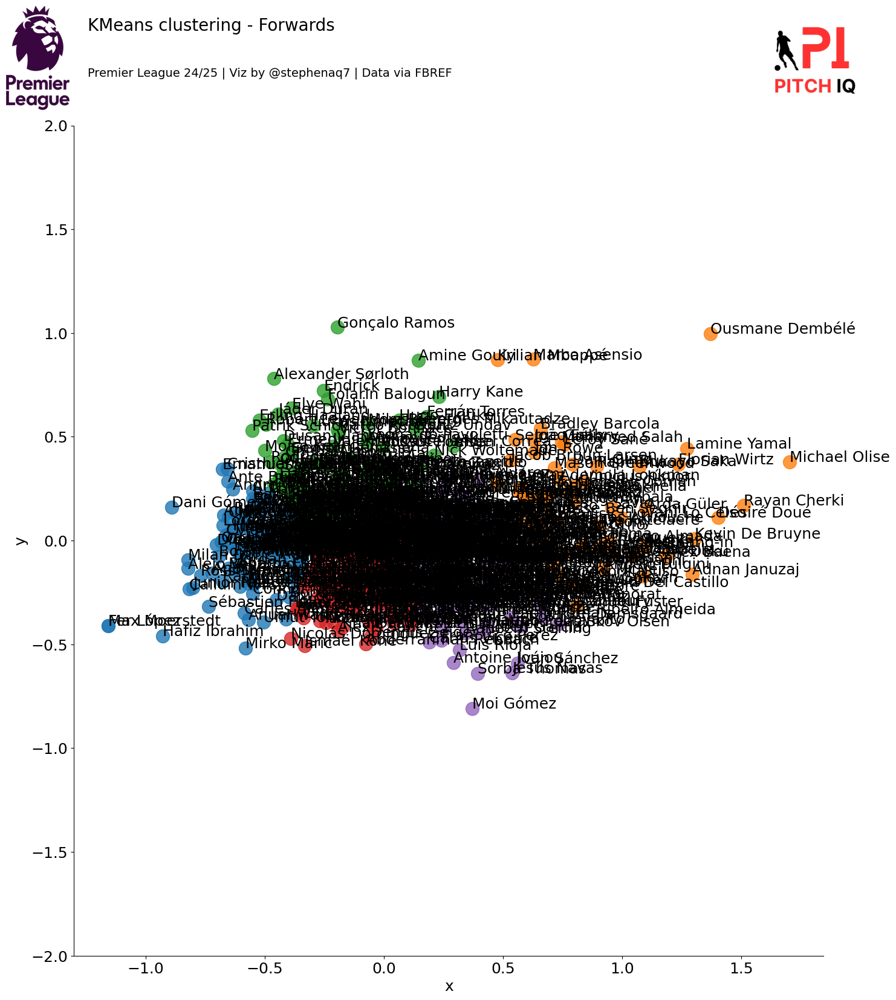

In [40]:
def create_clustering_chart(df,position):
    # Create the scatter plot using lmplot
    ax = sns.lmplot(x="x", y="y", hue='cluster', data=df, legend=False,
                    fit_reg=False, height=15, scatter_kws={"s": 250})

    texts = []
    for x, y, s in zip(df.x, df.y, df.name):
        texts.append(plt.text(x, y, s,fontweight='light'))


    # Additional axes for logos and titles
    fig = plt.gcf()
    ax1 = plt.gca()

    # Add title and logos to the current figure
    fig.text(.1, 1.08, f'KMeans clustering - {position}', size=20, font='Karla')
    fig.text(.1, 1.03, 'Premier League 24/25 | Viz by @stephenaq7 | Data via FBREF', size=14, font='Karla')

    ax2 = fig.add_axes([0.01, 0.175, 0.07, 1.75])
    ax2.axis('off')
    img = image.imread('/Users/stephenahiabah/Desktop/Code/cannoniq/Images/premier-league-2-logo.png')
    ax2.imshow(img)

    ax3 = fig.add_axes([0.85, 0.175, 0.1, 1.75])
    ax3.axis('off')
    img = image.imread('/Users/stephenahiabah/Desktop/Code/cannoniq/Images/piqmain.png')
    ax3.imshow(img)

    # Set axis limits and labels for the lmplot
    ax1.set(ylim=(-2, 2))
    plt.tick_params(labelsize=15)
    plt.xlabel("PC 1", fontsize=20)
    plt.ylabel("PC 2", fontsize=20)

    plt.tight_layout()
    plt.show()
    
create_clustering_chart(kmeans_df,position)

In [41]:
def find_similar_players(player_name, df, top_n=35):
    player = df[df['name'] == player_name].iloc[0]
    df['distance'] = np.sqrt((df['x'] - player['x'])**2 + (df['y'] - player['y'])**2)
    
    max_distance = df['distance'].max()  
    
    df['perc_similarity'] = (((max_distance - df['distance']) / max_distance) * 100) * 0.90
    
    similar_players = df.sort_values('distance').head(top_n + 1)  
    similar_players = similar_players[1:] 
    
    return similar_players


In [42]:
similairty_table = find_similar_players(player_name, kmeans_df)[['name','perc_similarity']]
similairty_table.rename(columns={'name': 'Player'}, inplace=True)
# Assuming 'pitchiq_scores' and 'similarity' are the DataFrames and you want to merge based on the 'Player' column
mertrics_similarity = pd.merge(similairty_table, pitch_iq_scores, on='Player', how='left')
mertrics_similarity = mertrics_similarity.drop_duplicates(subset=['Player'])
mertrics_similarity = mertrics_similarity[mertrics_similarity['Age'] < 32]


In [43]:
comparative_list = list(mertrics_similarity.Player.unique())
sim_index = list(mertrics_similarity.perc_similarity.unique())
sim_index = [round(item, 2) for item in sim_index]


In [44]:
met_sim = mertrics_similarity

In [45]:
mertrics_similarity

,Player,perc_similarity,Nation,Pos,Squad,Age,position_group,90s,Total - Cmp%,KP,TB,Sw,PPA,PrgP,Tkl%,Blocks,Tkl+Int,Clr,Carries - PrgDist,SCA90,GCA90,CrsPA,xA,Rec,PrgR,xG,Sh,SoT,Passing_Score,Defending_Score,Creation_Score,Shooting_Score
0,Noni Madueke,88.044775,eng ENG,FW,Chelsea,22,Forwards,22.6,77.4,1.415929,0.044248,0.176991,1.548673,3.053097,36.8,0.663717,1.548673,0.486726,154.203540,3.50,0.35,0.353982,0.141593,33.451327,10.000000,0.424779,3.539823,1.327434,6.886767,6.457144,7.199505,7.549688
1,Brahim Díaz,86.080050,ma MAR,"FW,MF",Real Madrid,24,Forwards,15.4,86.8,1.493506,0.519481,0.064935,1.233766,4.805195,36.8,0.844156,1.883117,0.129870,79.415584,3.64,0.78,0.000000,0.149351,43.441558,7.142857,0.344156,1.818182,0.974026,6.875997,5.865981,6.562094,6.165493
2,Karim Adeyemi,85.936881,de GER,"FW,MF",Dortmund,22,Forwards,15.9,74.3,1.761006,0.188679,0.125786,1.194969,1.761006,40.0,1.257862,1.698113,0.314465,97.044025,3.58,0.69,0.125786,0.257862,29.245283,9.622642,0.345912,2.893082,1.132075,5.900713,5.747062,6.347338,6.230322
3,Julián Álvarez,85.799454,ar ARG,FW,Atlético Madrid,24,Forwards,27.9,74.2,1.469534,0.501792,0.430108,1.362007,3.297491,26.7,1.111111,0.967742,0.430108,78.781362,3.87,0.54,0.179211,0.189964,31.971326,5.806452,0.505376,2.508961,1.290323,6.523059,5.385440,6.058540,6.523962
4,Gianluca Gaetano,85.564040,it ITA,"MF,FW",Cagliari,24,Forwards,11.2,72.3,1.964286,0.267857,0.446429,1.160714,3.660714,33.3,0.982143,1.517857,0.714286,38.839286,4.28,0.45,0.000000,0.205357,31.785714,7.321429,0.437500,2.678571,0.535714,6.978654,6.277589,6.390418,6.391895
5,Marvin Ducksch,85.013486,de GER,FW,Werder Bremen,30,Forwards,26.9,61.7,2.267658,0.297398,0.483271,1.115242,3.197026,21.4,0.892193,0.669145,0.966543,30.334572,3.83,0.45,0.297398,0.338290,25.018587,6.171004,0.375465,2.602230,1.003717,6.846002,5.857462,6.497330,6.518823
6,Alejandro Garnacho,84.709205,ar ARG,"MF,FW",Manchester Utd,20,Forwards,24.4,78.9,1.516393,0.081967,0.368852,1.024590,2.295082,32.4,2.213115,1.762295,0.450820,132.991803,3.40,0.25,0.204918,0.114754,36.393443,11.885246,0.299180,3.442623,1.188525,6.571959,6.934589,6.710086,6.892559
7,Badredine Bouanani,84.077201,dz ALG,"MF,FW",Nice,19,Forwards,12.2,76.7,1.639344,0.573770,0.081967,1.147541,3.606557,33.3,0.901639,1.803279,0.327869,112.459016,3.85,0.74,0.163934,0.180328,34.836066,7.622951,0.221311,2.459016,1.147541,6.506715,5.680058,6.529480,6.095132
8,Riccardo Orsolini,84.075555,it ITA,FW,Bologna,27,Forwards,20.9,65.8,1.435407,0.191388,0.622010,1.387560,3.301435,45.5,1.483254,1.148325,0.478469,85.023923,2.83,0.24,0.526316,0.138756,32.296651,8.899522,0.483254,3.444976,1.196172,7.465569,7.312831,7.146108,7.758038
9,Jamie Gittens,83.674946,eng ENG,"FW,MF",Dortmund,19,Forwards,19.7,76.5,1.065990,0.203046,0.152284,1.218274,2.131980,77.8,1.116751,2.081218,0.203046,143.451777,3.70,0.51,0.203046,0.208122,33.147208,9.137056,0.182741,2.639594,1.218274,6.377028,7.023956,6.937351,6.497491


In [46]:
params = ['Total - Cmp%','KP',
'PPA',
 'PrgP',
 'Tkl%',
 'Blocks',
 'Tkl+Int',
 'Clr',
 'Carries - PrgDist',
 'SCA90',
 'xA',
 'xG']

In [47]:
def plot_comparison_radars(player_name, params, comparative_list, pitch_iq_scores, metrics_similarity, sim_index):
    def get_player_data(df, player_name, params):
        player_data = df[df['Player'] == player_name][params].values.tolist()
        # Flatten the list
        return [val for sublist in player_data for val in sublist]
    
    main_player = get_player_data(pitch_iq_scores, player_name, params)
    comp_players = [get_player_data(metrics_similarity, comp, params) for comp in comparative_list]
    
    def convert_to_numeric(input_list):
        return [float(x) for x in input_list]
    
    numeric_main_player = convert_to_numeric(main_player)
    
    for idx, comp_player in enumerate(comp_players):
        numeric_comp_player = convert_to_numeric(comp_player)
        
        low = [min(value, value_2) * 0.5 for value, value_2 in zip(numeric_main_player, numeric_comp_player)]
        high = [max(value, value_2) * 1.05 for value, value_2 in zip(numeric_main_player, numeric_comp_player)]
        
        radar = Radar(params, low, high,
                      round_int=[False]*len(params),
                      num_rings=5,
                      ring_width=1, center_circle_radius=1)
        
        fig, ax = radar.setup_axis()
        fig.patch.set_facecolor('#f0f0f0')
        ax.set_facecolor('#f0f0f0')
        
        rings_inner = radar.draw_circles(ax=ax, facecolor='#ffb2b2')
        radar_output = radar.draw_radar_compare(numeric_main_player, numeric_comp_player, ax=ax,
                                                kwargs_radar={'facecolor': '#00f2c1', 'alpha': 0.6},
                                                kwargs_compare={'facecolor': '#d80499', 'alpha': 0.6})
        radar_poly, radar_poly2, vertices1, vertices2 = radar_output
        range_labels = radar.draw_range_labels(ax=ax, fontsize=15)
        param_labels = radar.draw_param_labels(ax=ax, fontsize=15)
        
        ax.legend([player_name, comparative_list[idx]], loc='upper right', fontsize=12)
        
        league_icon = Image.open("/Users/stephenahiabah/Desktop/Code/cannoniq/Images/premier-league-2-logo.png")
        league_ax = fig.add_axes([0.002, 0.89, 0.20, 0.15], zorder=1)
        league_ax.imshow(league_icon)
        league_ax.axis("off")
        
        fig_text(
            x=0.57, y=0.90,
            s=f"{player_name} vs {comparative_list[idx]}\nSeason 2023/2024\nPitch IQ Similarity Score: {sim_index[idx]}%\nViz by @stephenaq7.",
            va="bottom", ha="right",
            fontsize=17, color="black", weight="book"
        )
        
        ax3 = fig.add_axes([0.80, 0.09, 0.13, 1.75])
        ax3.axis('off')
        img = image.imread('/Users/stephenahiabah/Desktop/Code/cannoniq/Images/piqmain.png')
        ax3.imshow(img)
        
        plt.show()



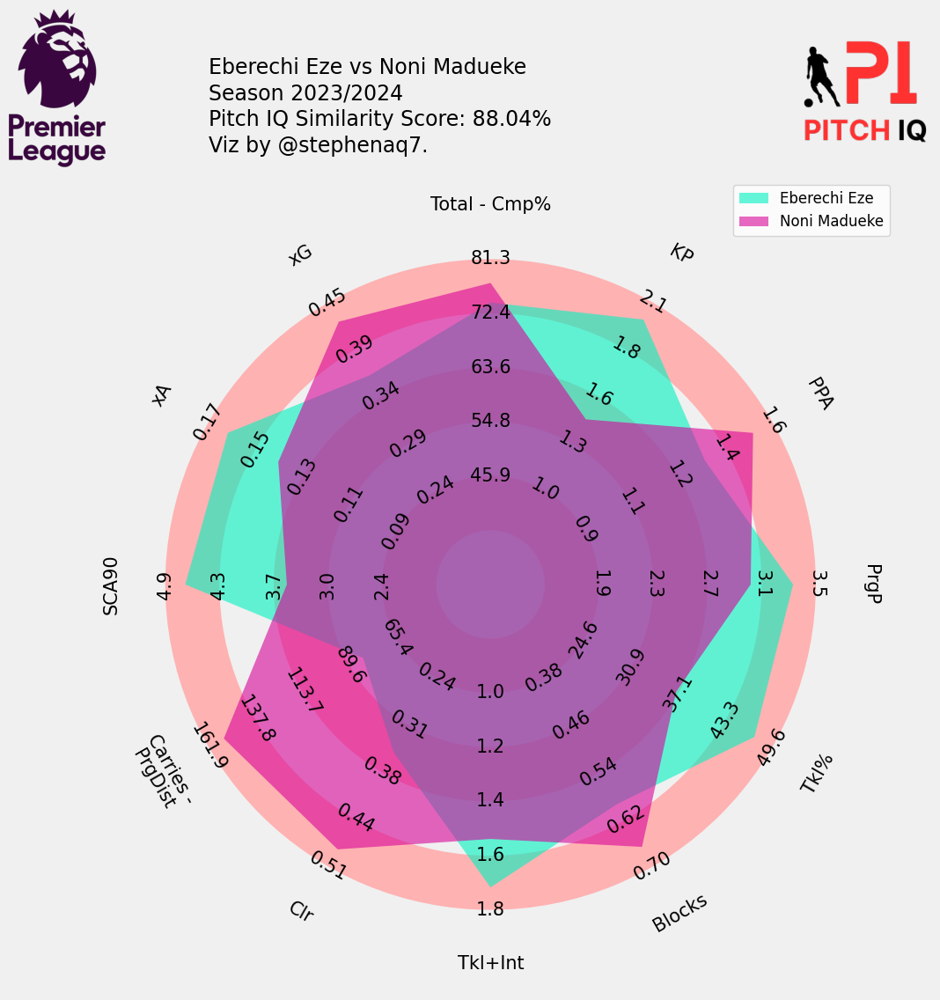

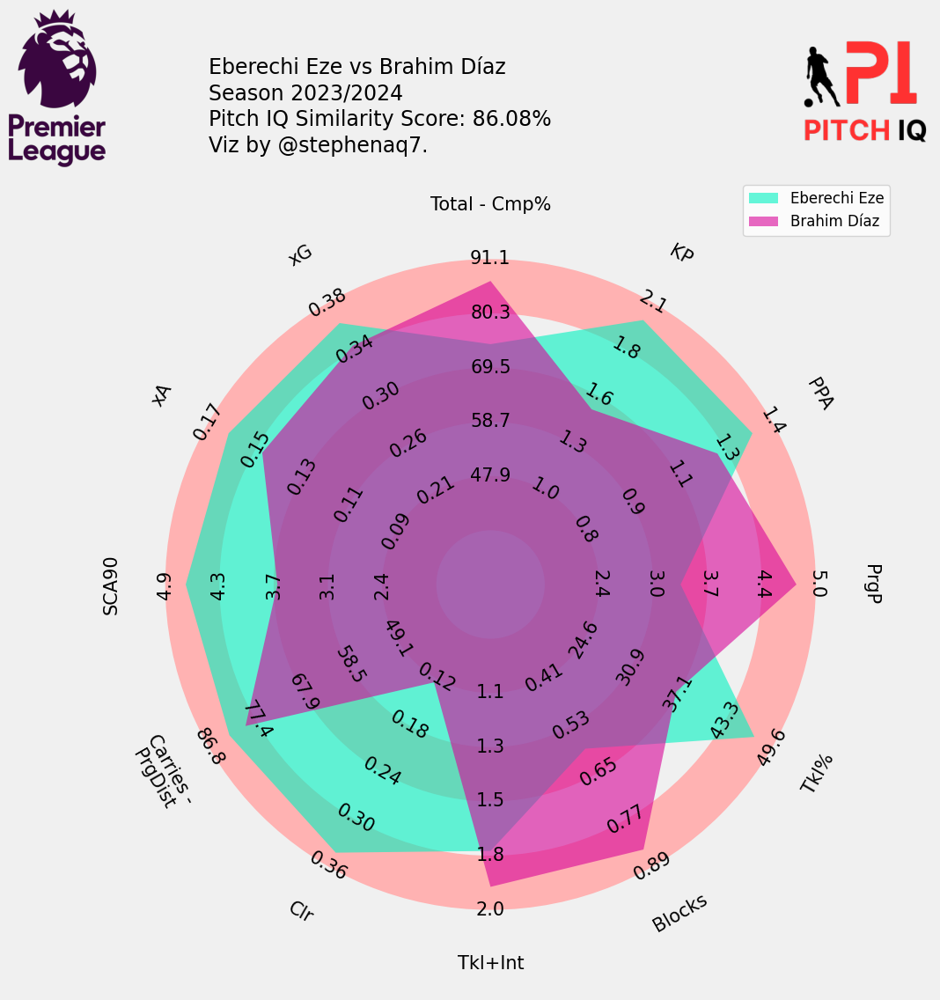

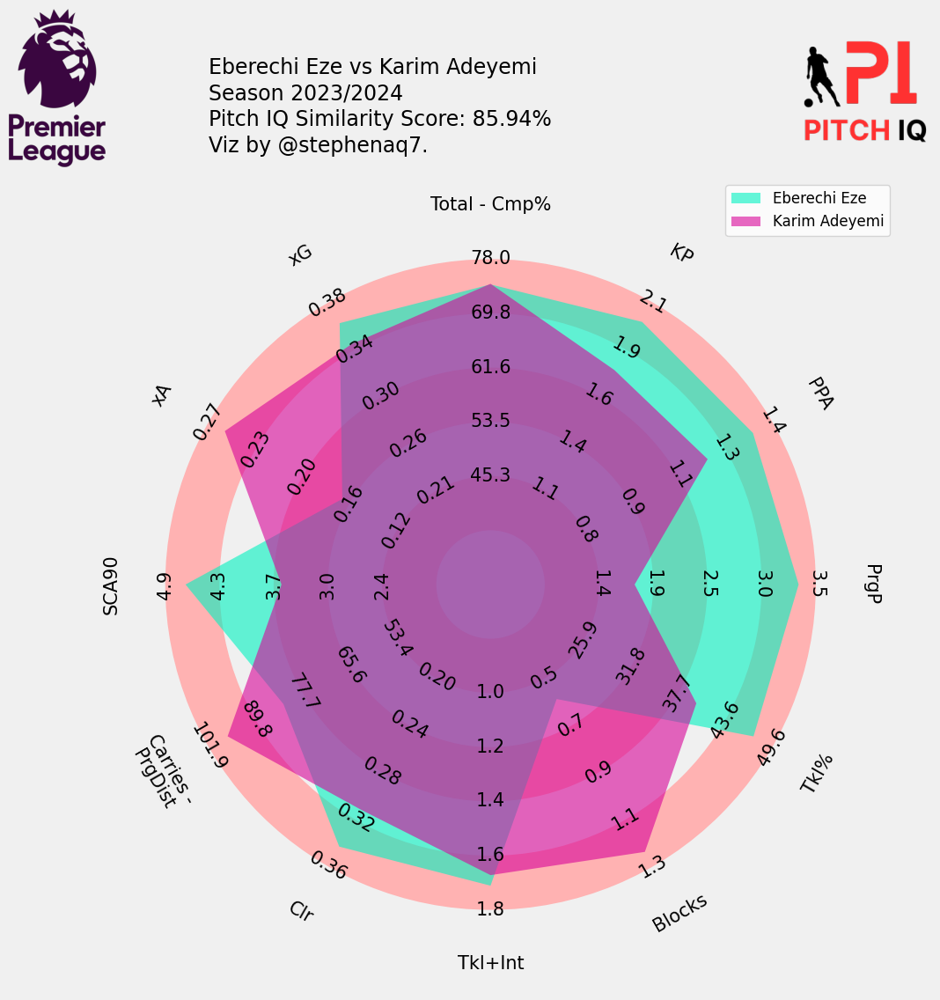

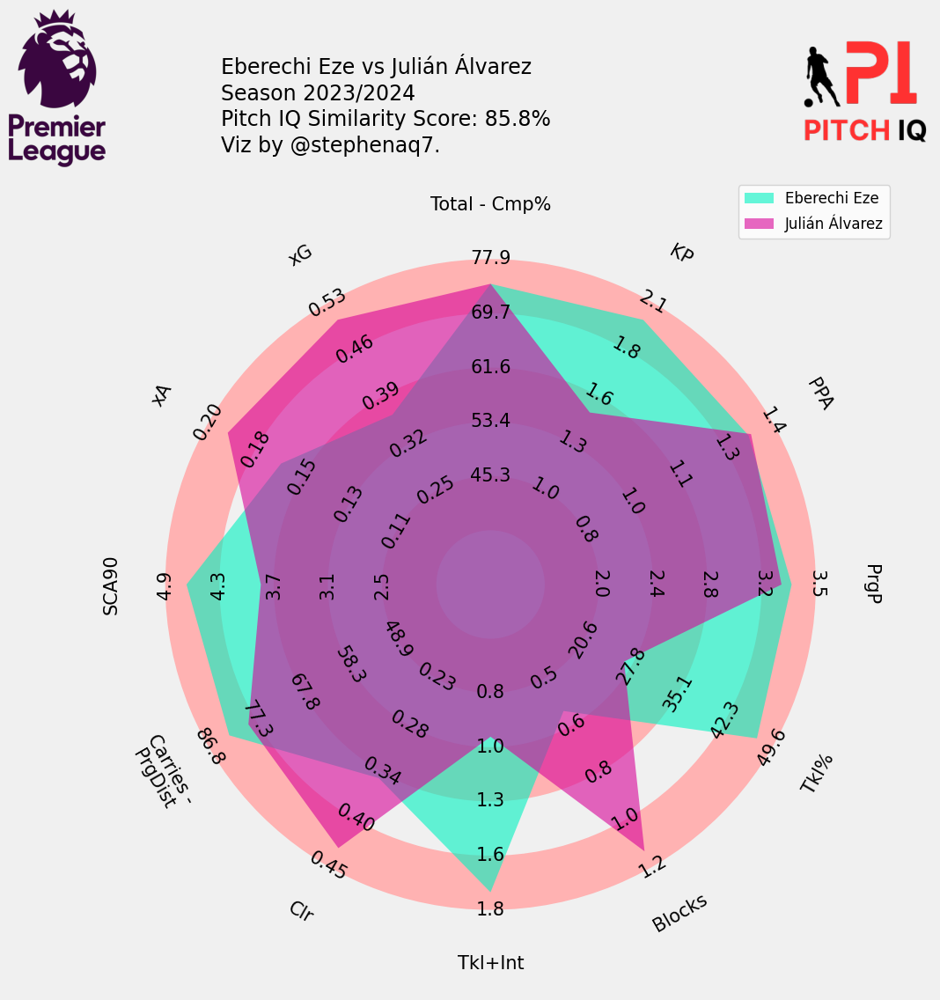

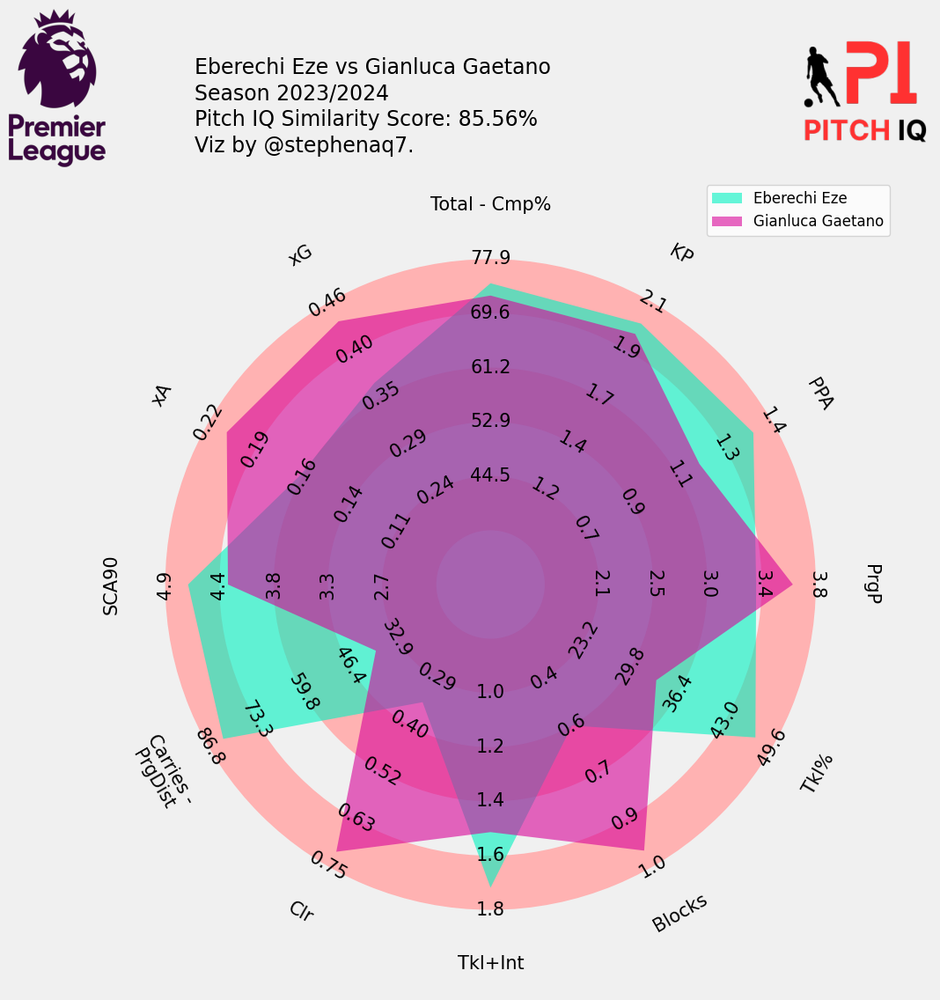

...

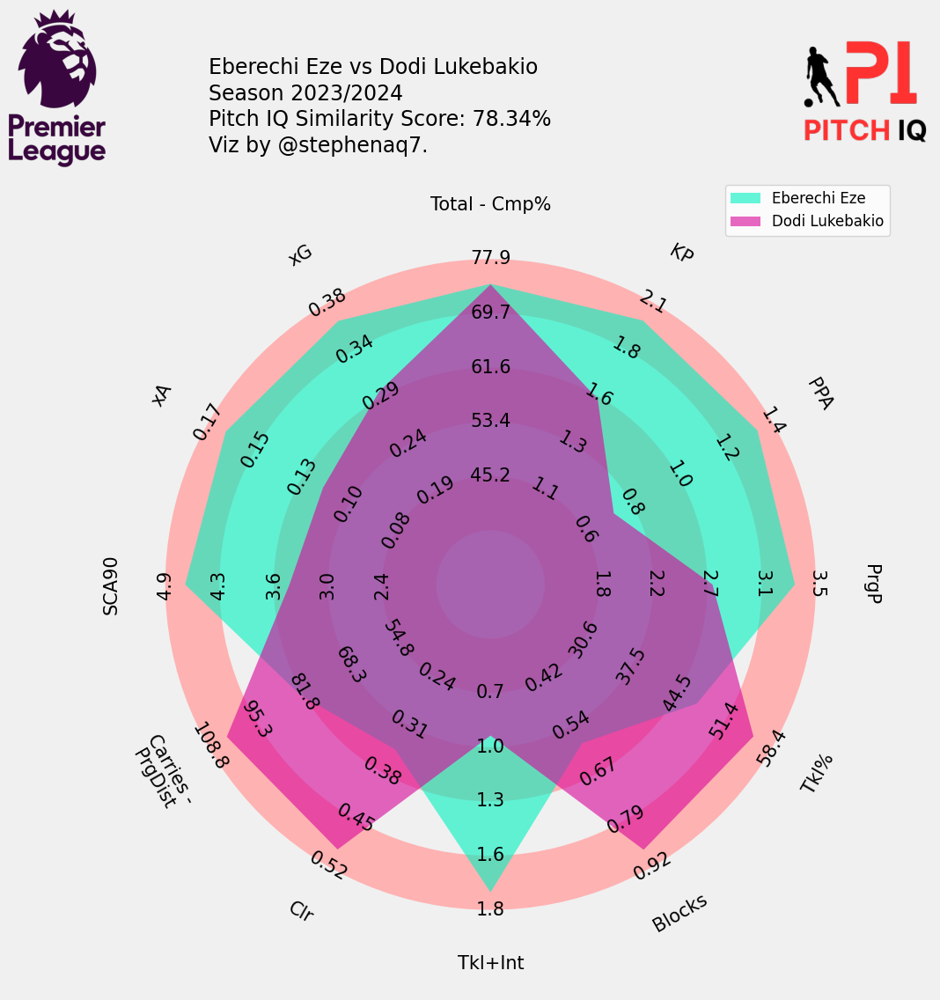

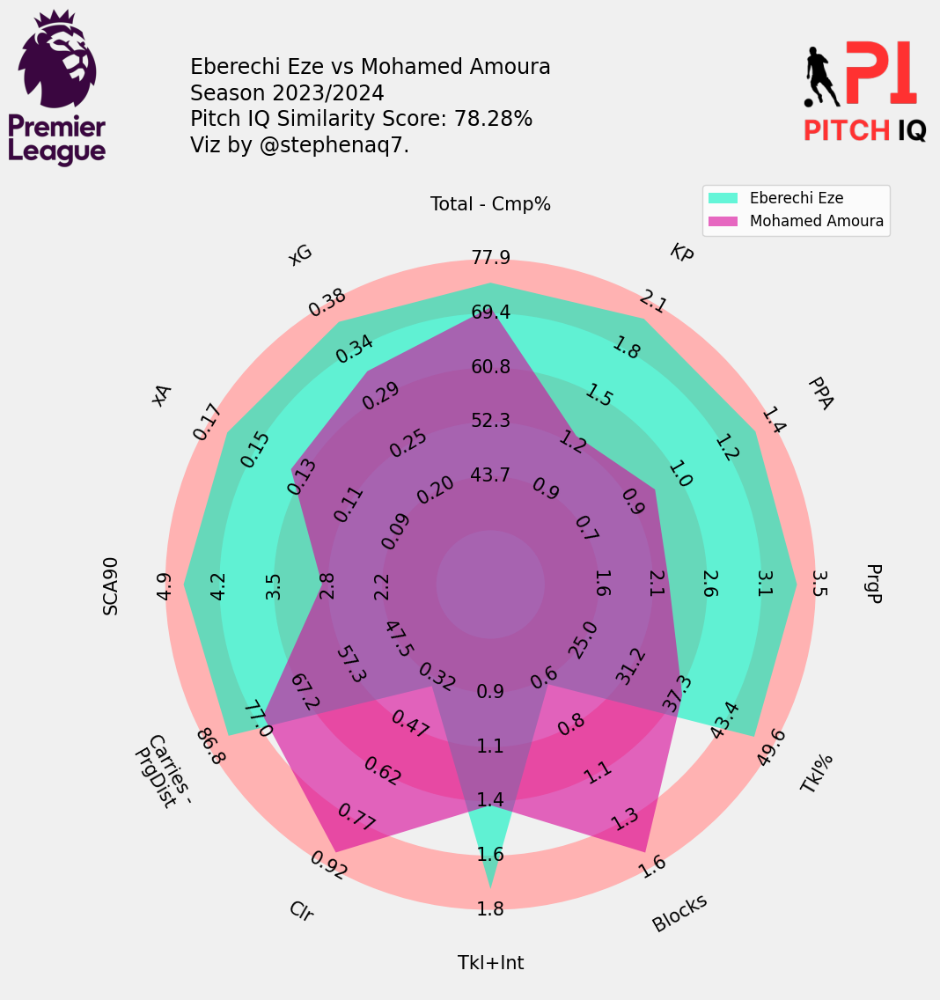

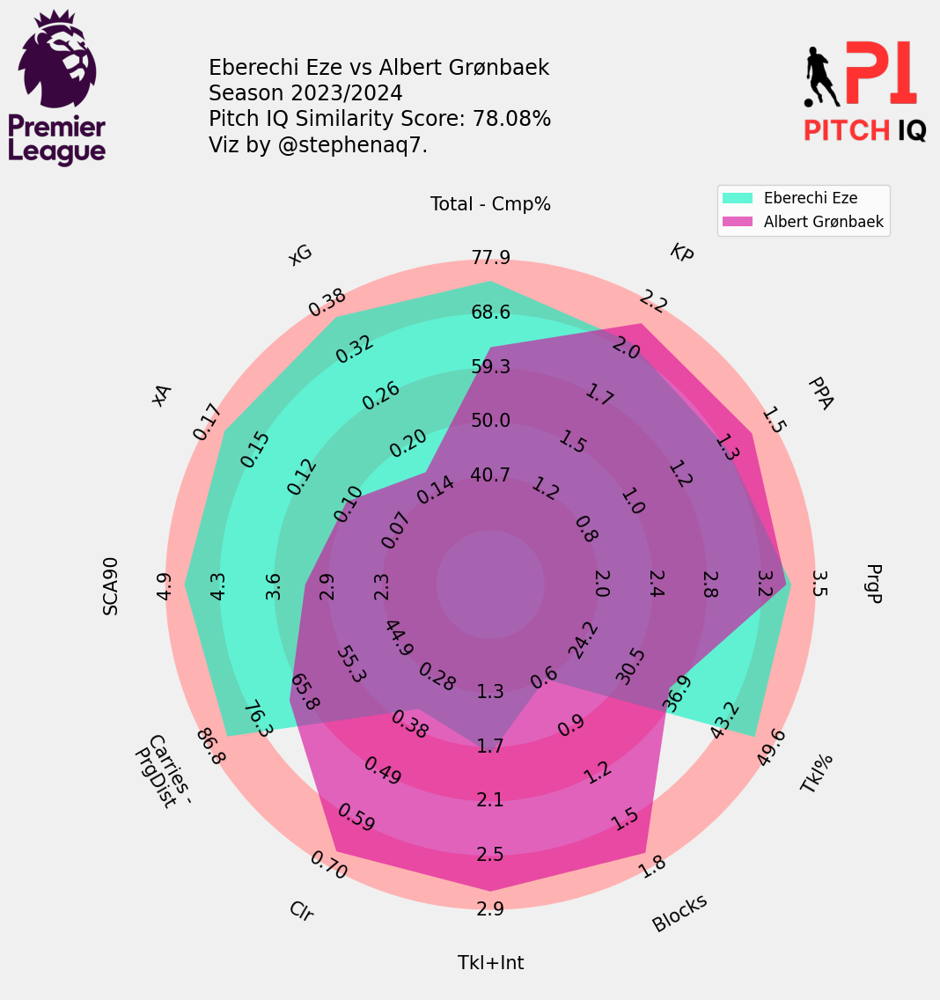

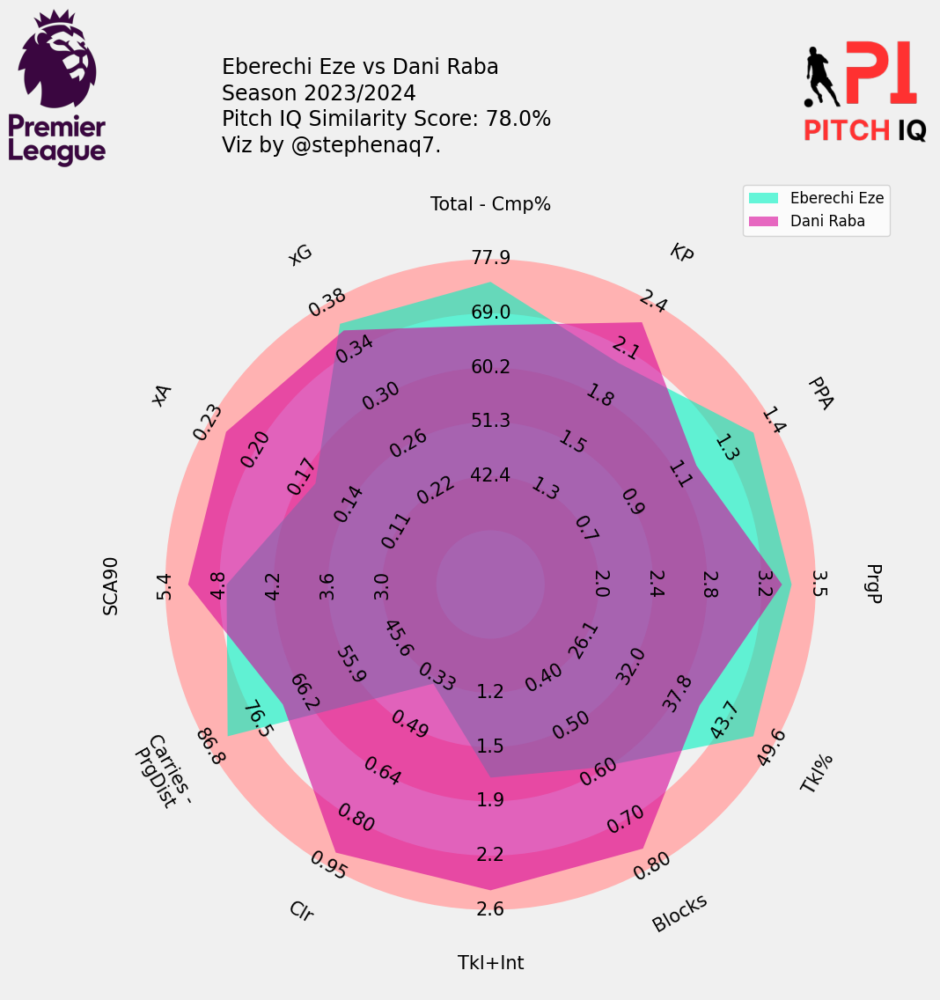

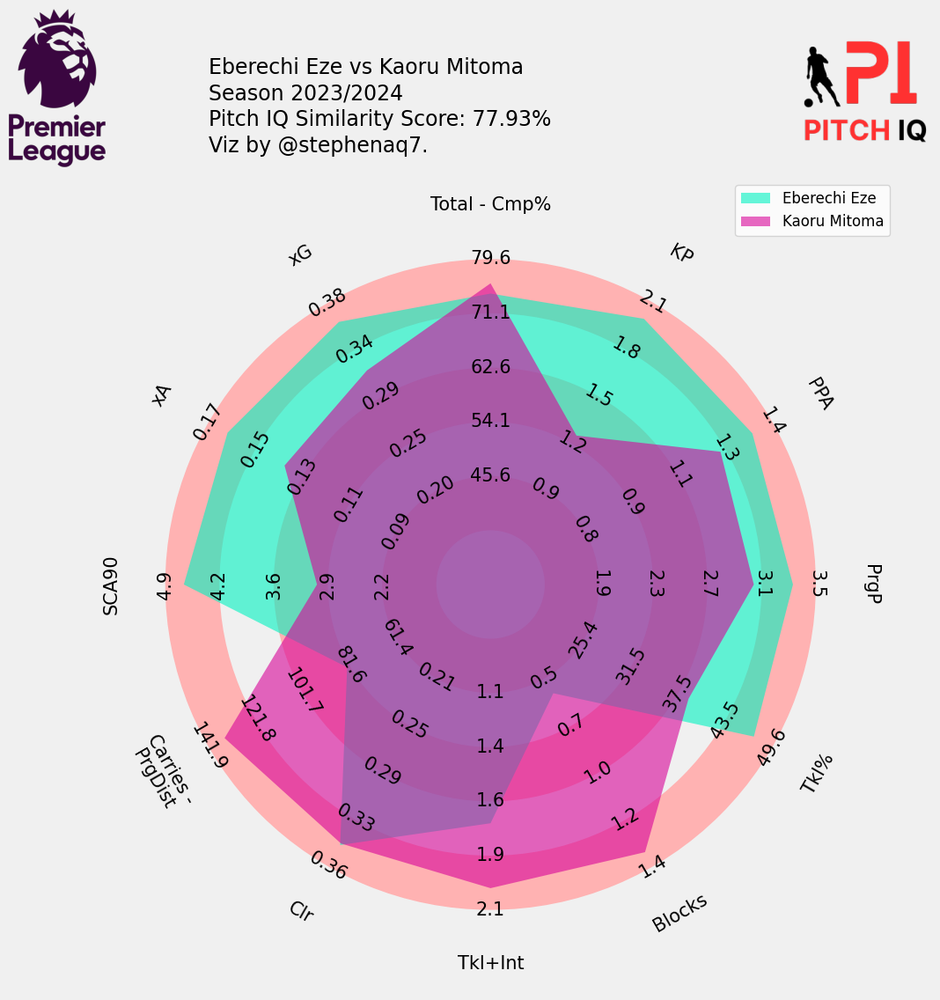

In [48]:
plot_comparison_radars(player_name, params, comparative_list, pitch_iq_scores, mertrics_similarity, sim_index)

In [49]:
mertrics_similarity

,Player,perc_similarity,Nation,Pos,Squad,Age,position_group,90s,Total - Cmp%,KP,TB,Sw,PPA,PrgP,Tkl%,Blocks,Tkl+Int,Clr,Carries - PrgDist,SCA90,GCA90,CrsPA,xA,Rec,PrgR,xG,Sh,SoT,Passing_Score,Defending_Score,Creation_Score,Shooting_Score
0,Noni Madueke,88.044775,eng ENG,FW,Chelsea,22,Forwards,22.6,77.4,1.415929,0.044248,0.176991,1.548673,3.053097,36.8,0.663717,1.548673,0.486726,154.203540,3.50,0.35,0.353982,0.141593,33.451327,10.000000,0.424779,3.539823,1.327434,6.886767,6.457144,7.199505,7.549688
1,Brahim Díaz,86.080050,ma MAR,"FW,MF",Real Madrid,24,Forwards,15.4,86.8,1.493506,0.519481,0.064935,1.233766,4.805195,36.8,0.844156,1.883117,0.129870,79.415584,3.64,0.78,0.000000,0.149351,43.441558,7.142857,0.344156,1.818182,0.974026,6.875997,5.865981,6.562094,6.165493
2,Karim Adeyemi,85.936881,de GER,"FW,MF",Dortmund,22,Forwards,15.9,74.3,1.761006,0.188679,0.125786,1.194969,1.761006,40.0,1.257862,1.698113,0.314465,97.044025,3.58,0.69,0.125786,0.257862,29.245283,9.622642,0.345912,2.893082,1.132075,5.900713,5.747062,6.347338,6.230322
3,Julián Álvarez,85.799454,ar ARG,FW,Atlético Madrid,24,Forwards,27.9,74.2,1.469534,0.501792,0.430108,1.362007,3.297491,26.7,1.111111,0.967742,0.430108,78.781362,3.87,0.54,0.179211,0.189964,31.971326,5.806452,0.505376,2.508961,1.290323,6.523059,5.385440,6.058540,6.523962
4,Gianluca Gaetano,85.564040,it ITA,"MF,FW",Cagliari,24,Forwards,11.2,72.3,1.964286,0.267857,0.446429,1.160714,3.660714,33.3,0.982143,1.517857,0.714286,38.839286,4.28,0.45,0.000000,0.205357,31.785714,7.321429,0.437500,2.678571,0.535714,6.978654,6.277589,6.390418,6.391895
5,Marvin Ducksch,85.013486,de GER,FW,Werder Bremen,30,Forwards,26.9,61.7,2.267658,0.297398,0.483271,1.115242,3.197026,21.4,0.892193,0.669145,0.966543,30.334572,3.83,0.45,0.297398,0.338290,25.018587,6.171004,0.375465,2.602230,1.003717,6.846002,5.857462,6.497330,6.518823
6,Alejandro Garnacho,84.709205,ar ARG,"MF,FW",Manchester Utd,20,Forwards,24.4,78.9,1.516393,0.081967,0.368852,1.024590,2.295082,32.4,2.213115,1.762295,0.450820,132.991803,3.40,0.25,0.204918,0.114754,36.393443,11.885246,0.299180,3.442623,1.188525,6.571959,6.934589,6.710086,6.892559
7,Badredine Bouanani,84.077201,dz ALG,"MF,FW",Nice,19,Forwards,12.2,76.7,1.639344,0.573770,0.081967,1.147541,3.606557,33.3,0.901639,1.803279,0.327869,112.459016,3.85,0.74,0.163934,0.180328,34.836066,7.622951,0.221311,2.459016,1.147541,6.506715,5.680058,6.529480,6.095132
8,Riccardo Orsolini,84.075555,it ITA,FW,Bologna,27,Forwards,20.9,65.8,1.435407,0.191388,0.622010,1.387560,3.301435,45.5,1.483254,1.148325,0.478469,85.023923,2.83,0.24,0.526316,0.138756,32.296651,8.899522,0.483254,3.444976,1.196172,7.465569,7.312831,7.146108,7.758038
9,Jamie Gittens,83.674946,eng ENG,"FW,MF",Dortmund,19,Forwards,19.7,76.5,1.065990,0.203046,0.152284,1.218274,2.131980,77.8,1.116751,2.081218,0.203046,143.451777,3.70,0.51,0.203046,0.208122,33.147208,9.137056,0.182741,2.639594,1.218274,6.377028,7.023956,6.937351,6.497491


In [50]:
mertrics_similarity = mertrics_similarity.rename(columns={'Squad': 'team'})
fm_ids = pd.read_csv("/Users/stephenahiabah/Desktop/Code/cannoniq/CSVs/Top6_leagues_fotmob_ids.csv")
fm_ids = fm_ids[["team", "team_id"]]

mertrics_similarity = mertrics_similarity.merge(fm_ids, on='team', how='left')
mertrics_similarity = mertrics_similarity.dropna(subset=['team_id'])
mertrics_similarity['team_id'] = mertrics_similarity['team_id'].astype(float).astype(int)

mertrics_similarity

,Player,perc_similarity,Nation,Pos,team,Age,position_group,90s,Total - Cmp%,KP,TB,Sw,PPA,PrgP,Tkl%,Blocks,Tkl+Int,Clr,Carries - PrgDist,SCA90,GCA90,CrsPA,xA,Rec,PrgR,xG,Sh,SoT,Passing_Score,Defending_Score,Creation_Score,Shooting_Score,team_id
0,Noni Madueke,88.044775,eng ENG,FW,Chelsea,22,Forwards,22.6,77.4,1.415929,0.044248,0.176991,1.548673,3.053097,36.8,0.663717,1.548673,0.486726,154.203540,3.50,0.35,0.353982,0.141593,33.451327,10.000000,0.424779,3.539823,1.327434,6.886767,6.457144,7.199505,7.549688,8455
1,Brahim Díaz,86.080050,ma MAR,"FW,MF",Real Madrid,24,Forwards,15.4,86.8,1.493506,0.519481,0.064935,1.233766,4.805195,36.8,0.844156,1.883117,0.129870,79.415584,3.64,0.78,0.000000,0.149351,43.441558,7.142857,0.344156,1.818182,0.974026,6.875997,5.865981,6.562094,6.165493,8633
2,Karim Adeyemi,85.936881,de GER,"FW,MF",Dortmund,22,Forwards,15.9,74.3,1.761006,0.188679,0.125786,1.194969,1.761006,40.0,1.257862,1.698113,0.314465,97.044025,3.58,0.69,0.125786,0.257862,29.245283,9.622642,0.345912,2.893082,1.132075,5.900713,5.747062,6.347338,6.230322,9789
3,Julián Álvarez,85.799454,ar ARG,FW,Atlético Madrid,24,Forwards,27.9,74.2,1.469534,0.501792,0.430108,1.362007,3.297491,26.7,1.111111,0.967742,0.430108,78.781362,3.87,0.54,0.179211,0.189964,31.971326,5.806452,0.505376,2.508961,1.290323,6.523059,5.385440,6.058540,6.523962,9906
4,Gianluca Gaetano,85.564040,it ITA,"MF,FW",Cagliari,24,Forwards,11.2,72.3,1.964286,0.267857,0.446429,1.160714,3.660714,33.3,0.982143,1.517857,0.714286,38.839286,4.28,0.45,0.000000,0.205357,31.785714,7.321429,0.437500,2.678571,0.535714,6.978654,6.277589,6.390418,6.391895,8529
5,Marvin Ducksch,85.013486,de GER,FW,Werder Bremen,30,Forwards,26.9,61.7,2.267658,0.297398,0.483271,1.115242,3.197026,21.4,0.892193,0.669145,0.966543,30.334572,3.83,0.45,0.297398,0.338290,25.018587,6.171004,0.375465,2.602230,1.003717,6.846002,5.857462,6.497330,6.518823,8697
6,Alejandro Garnacho,84.709205,ar ARG,"MF,FW",Manchester Utd,20,Forwards,24.4,78.9,1.516393,0.081967,0.368852,1.024590,2.295082,32.4,2.213115,1.762295,0.450820,132.991803,3.40,0.25,0.204918,0.114754,36.393443,11.885246,0.299180,3.442623,1.188525,6.571959,6.934589,6.710086,6.892559,10260
7,Badredine Bouanani,84.077201,dz ALG,"MF,FW",Nice,19,Forwards,12.2,76.7,1.639344,0.573770,0.081967,1.147541,3.606557,33.3,0.901639,1.803279,0.327869,112.459016,3.85,0.74,0.163934,0.180328,34.836066,7.622951,0.221311,2.459016,1.147541,6.506715,5.680058,6.529480,6.095132,9831
8,Riccardo Orsolini,84.075555,it ITA,FW,Bologna,27,Forwards,20.9,65.8,1.435407,0.191388,0.622010,1.387560,3.301435,45.5,1.483254,1.148325,0.478469,85.023923,2.83,0.24,0.526316,0.138756,32.296651,8.899522,0.483254,3.444976,1.196172,7.465569,7.312831,7.146108,7.758038,9857
9,Jamie Gittens,83.674946,eng ENG,"FW,MF",Dortmund,19,Forwards,19.7,76.5,1.065990,0.203046,0.152284,1.218274,2.131980,77.8,1.116751,2.081218,0.203046,143.451777,3.70,0.51,0.203046,0.208122,33.147208,9.137056,0.182741,2.639594,1.218274,6.377028,7.023956,6.937351,6.497491,9789


In [51]:
mertrics_similarity[['perc_similarity', 'Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']] = \
    mertrics_similarity[['perc_similarity', 'Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']].round(2)

# Storing the rounded values in df_final
df_final = mertrics_similarity[['Player', 'Pos','team_id','perc_similarity', 'Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']]
metric_scores =['Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']

sim_player_vals = pitch_iq_scores[pitch_iq_scores['Player'] == player_name][metric_scores].values.tolist()

sim_player_vals = [val for sublist in sim_player_vals for val in sublist]
df_final['Δ% Passing'] = ((df_final['Passing_Score'] - sim_player_vals[0]) / sim_player_vals[0]).round(1) * 100
df_final['Δ% Defending'] = ((df_final['Defending_Score'] - sim_player_vals[1]) / sim_player_vals[1]).round(1) * 100
df_final['Δ% Creation'] = ((df_final['Creation_Score'] - sim_player_vals[2]) / sim_player_vals[2]).round(1) * 100
df_final['Δ% Shooting'] = ((df_final['Shooting_Score'] - sim_player_vals[3]) / sim_player_vals[3]).round(1) * 100

df_final = df_final[::-1]


/var/folders/64/gffmh1qd2cl426g_n8z6k9kh0000gn/T/ipykernel_8728/3866650021.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final['Δ% Passing'] = ((df_final['Passing_Score'] - sim_player_vals[0]) / sim_player_vals[0]).round(1) * 100
/var/folders/64/gffmh1qd2cl426g_n8z6k9kh0000gn/T/ipykernel_8728/3866650021.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final['Δ% Defending'] = ((df_final['Defending_Score'] - sim_player_vals[1]) / sim_player_vals[1]).round(1) * 100
/var/folders/64/gffmh1qd2cl4

In [52]:
sim_player = pitch_iq_scores[pitch_iq_scores['Player'] == player_name][metric_scores]
sim_player

,Passing_Score,Defending_Score,Creation_Score,Shooting_Score
193,6.863328,6.076352,6.379581,6.762393


In [53]:
def perc_battery(perc_similarity, ax):
    '''
    This function takes an integer and an axes and 
    plots a battery chart.
    '''
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.barh([0.5], [1], fc = 'white', ec='black', height=.35)
    ax.barh([0.5], [perc_similarity/100], fc = '#00529F', height=.35)
    text_ = ax.annotate(
        xy=((perc_similarity/100), .5),
        text=f'{(perc_similarity/100):.0%}',
        xytext=(-8,0),
        textcoords='offset points',
        weight='bold',
        color='#EFE9E6',
        va='center',
        ha='center',
        size=8
    )
    ax.set_axis_off()
    return ax

def ax_logo(team_id, ax):
    '''
    Plots the logo of the team at a specific axes.
    Args:
        team_id (int): the id of the team according to Fotmob. You can find it in the url of the team page.
        ax (object): the matplotlib axes where we'll draw the image.
    '''
    fotmob_url = 'https://images.fotmob.com/image_resources/logo/teamlogo/'
    club_icon = Image.open(urllib.request.urlopen(f'{fotmob_url}{team_id}.png'))
    ax.imshow(club_icon)
    ax.axis('off')
    return ax

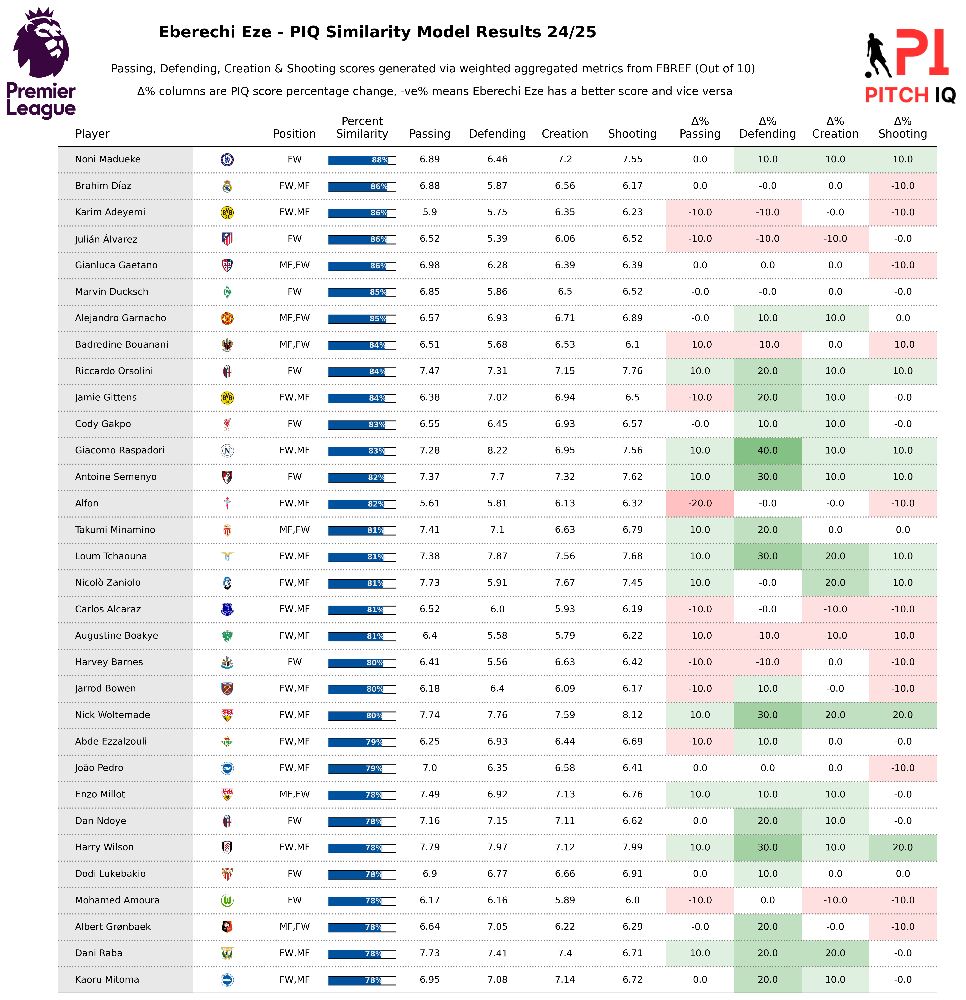

In [54]:
fig = plt.figure(figsize=(17,17), dpi=400)
ax = plt.subplot()

ncols = 12
nrows = df_final.shape[0]

ax.set_xlim(0, ncols + 1)
ax.set_ylim(0, nrows + 1)

positions = [0.25, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5, 10.5, 11.5, 12.5, 13.5]
columns = ['Player', 'Pos', 'perc_similarity', 'Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score', 'Δ% Passing', 'Δ% Defending', 'Δ% Creation', 'Δ% Shooting']

# -- Add table's main text
for i in range(nrows):
    for j, column in enumerate(columns):
        if j == 0:
            ha = 'left'
        else:
            ha = 'center'
        if column == 'perc_similarity':
            continue
        else:
            text_label = f'{df_final[column].iloc[i]}'
            weight = 'normal'
        ax.annotate(
            xy=(positions[j], i + .5),
            text=text_label,
            ha=ha,
            va='center',
            size = 10,
            weight=weight
        )

# -- Transformation functions
DC_to_FC = ax.transData.transform
FC_to_NFC = fig.transFigure.inverted().transform
# -- Take data coordinates and transform them to normalized figure coordinates
DC_to_NFC = lambda x: FC_to_NFC(DC_to_FC(x))
# -- Add nation axes
ax_point_1 = DC_to_NFC([2.25, 0.25])
ax_point_2 = DC_to_NFC([2.75, 0.75])
ax_width = abs(ax_point_1[0] - ax_point_2[0])
ax_height = abs(ax_point_1[1] - ax_point_2[1])
for x in range(0, nrows):
    ax_coords = DC_to_NFC([2.25, x + .25])
    flag_ax = fig.add_axes(
        [ax_coords[0], ax_coords[1], ax_width, ax_height]
    )
    ax_logo(df_final['team_id'].iloc[x], flag_ax)

ax_point_1 = DC_to_NFC([4, 0.05])
ax_point_2 = DC_to_NFC([5, 0.95])
ax_width = abs(ax_point_1[0] - ax_point_2[0])
ax_height = abs(ax_point_1[1] - ax_point_2[1])
for x in range(0, nrows):
    ax_coords = DC_to_NFC([4, x + .025])
    bar_ax = fig.add_axes(
        [ax_coords[0], ax_coords[1], ax_width, ax_height]
    )
    perc_battery(df_final['perc_similarity'].iloc[x], bar_ax)

# -- Add column names
column_names = ['Player', 'Position', 'Percent\nSimilarity','Passing', 'Defending', 'Creation', 'Shooting','Δ%\nPassing','Δ%\nDefending','Δ%\nCreation','Δ%\nShooting']
for index, c in enumerate(column_names):
        if index == 0:
            ha = 'left'
        else:
            ha = 'center'
        ax.annotate(
            xy=(positions[index], nrows + .25),
            text=column_names[index],
            ha=ha,
            va='bottom',
            size = 12,
            weight='book'
        )

# Add dividing lines
ax.plot([ax.get_xlim()[0], ax.get_xlim()[1]], [nrows, nrows], lw=1.5, color='black', marker='', zorder=4)
ax.plot([ax.get_xlim()[0], ax.get_xlim()[1]], [0, 0], lw=1.5, color='black', marker='', zorder=4)
for x in range(1, nrows):
    ax.plot([ax.get_xlim()[0], ax.get_xlim()[1]], [x, x], lw=1.15, color='gray', ls=':', zorder=3 , marker='')

ax.fill_between(
    x=[0,2],
    y1=nrows,
    y2=0,
    color='lightgrey',
    alpha=0.5,
    ec='None'
)

# Custom colormap and normalization
cmap = mcolors.LinearSegmentedColormap.from_list('red_green', ['red', 'white', 'green'])
norm = mcolors.Normalize(vmin=-50, vmax=50)

# Example of Δ% columns to be visualized
delta_columns = ['Δ% Passing', 'Δ% Defending', 'Δ% Creation', 'Δ% Shooting']

# Loop through delta columns and fill between with corresponding color
for idx, col in enumerate(delta_columns):
    for i in range(nrows):
        value = df_final[col].iloc[i]
        ax.fill_between(
            x=[9 + idx, 10 + idx],
            y1=i + 1,
            y2=i,
            color=cmap(norm(value)),
            alpha=0.6,
            ec='None'
        )

ax.set_axis_off()

# -- Final details
league_icon = Image.open("/Users/stephenahiabah/Desktop/Code/cannoniq/Images//premier-league-2-logo.png")
league_ax = fig.add_axes([0.06, 0.88, 0.10, 0.10], zorder=1)
league_ax.imshow(league_icon)
league_ax.axis("off")

ax.tick_params(axis='both', which='major', labelsize=8)

fig_text(
     x = 0.6, y = 0.95, 
    s = f'{player_name} - PIQ Similarity Model Results 24/25',
    va = "bottom", ha = "right",
    fontsize = 17, color = "black", weight = "bold"
)

fig_text(
     x = 0.74, y = 0.92, 
    s = f'Passing, Defending, Creation & Shooting scores generated via weighted aggregated metrics from FBREF (Out of 10)',
    va = "bottom", ha = "right",
    fontsize = 12, color = "black", weight = "book"
)
fig_text(
     x = 0.72, y = 0.90, 
    s = f'Δ% columns are PIQ score percentage change, -ve% means {player_name} has a better score and vice versa',
    va = "bottom", ha = "right",
    fontsize = 12, color = "black", weight = "book"
)

### Add Stats by Steve logo
ax3 = fig.add_axes([0.83, 0.13, 0.09, 1.60])
ax3.axis('off')
img = plt.imread('/Users/stephenahiabah/Desktop/Code/cannoniq/Images/piqmain.png')
ax3.imshow(img)
plt.show()

In [55]:
import matplotlib.pyplot as plt
from PIL import Image
from matplotlib import image
import matplotlib as mpl
from mplsoccer import PyPizza, FontManager

from scipy.stats import percentileofscore

def calculate_percentiles(sim_player, pitch_iq_scores):
    # Define the columns to compare
    score_columns = ['Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']
    
    # Initialize an empty dictionary to store percentiles
    percentiles = {}
    
    # Iterate over each score column
    for col in score_columns:
        sim_score = sim_player[col].values[0]
        percentiles[col] = percentileofscore(pitch_iq_scores[col], sim_score, kind='rank')
    
    # Create a new DataFrame from the percentiles dictionary
    sim_player_perc = pd.DataFrame([percentiles])
    
    return sim_player_perc

def create_combined_plot(sim_player, player_name, pos, pitch_iq_scores):
    style.use('fivethirtyeight')
    # Filter dataset for player and select columns of interest
    lst_cols_pr = ['Passing_Score', 'Defending_Score', 'Creation_Score', 'Shooting_Score']
    sim_player_perc = calculate_percentiles(sim_player, pitch_iq_scores)
    df_player_pr = sim_player_perc.reset_index(drop=True)
    df_player_pr_t = df_player_pr[lst_cols_pr].T.reset_index(drop=False)
    df_player_pr_t.columns = ['Metric', 'PR']

    dict_metrics = {
        'Passing_Score': 'Passing',
        'Defending_Score': 'Defending',
        'Creation_Score': 'Creating',
        'Shooting_Score': 'Shooting'
    }
    df_player_pr_t['Metric'] = df_player_pr_t['Metric'].map(dict_metrics)

    # Define fonts and colors
    background = '#f7f7f7'
    text_color = 'black'
    mpl.rcParams.update(mpl.rcParamsDefault)
    mpl.rcParams['xtick.color'] = text_color
    mpl.rcParams['ytick.color'] = text_color
    mpl.rcParams.update({'font.size': 18})

    # Define labels and metrics
    metric = df_player_pr_t['Metric']
    pr = df_player_pr_t['PR']

    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

    # Create combined figure
    fig = plt.figure(figsize=(26, 26))
    gs = fig.add_gridspec(6, 2, height_ratios=[1, 1, 1, 1, 1, 1.5], width_ratios=[1, 0.8])
    fig.set_facecolor(background)

    # Bar Chart on the top left
    ax1 = fig.add_subplot(gs[0:2, 0])
    ax1.set_facecolor(background)
    ax1.barh(metric, pr / 100, color=colors, alpha=0.75)
    for s in ['top', 'bottom', 'left', 'right']:
        ax1.spines[s].set_visible(False)
    ax1.xaxis.set_ticks_position('none')
    ax1.yaxis.set_ticks_position('none')
    ax1.xaxis.set_tick_params(pad=2)
    ax1.yaxis.set_tick_params(pad=20)
    ax1.grid(b=True, color='grey', linestyle='-.', linewidth=0.5, alpha=0.2)
    ax1.invert_yaxis()
    for i in ax1.patches:
        ax1.text(i.get_width() + 0.015, i.get_y() + 0.4, str(round((100 * i.get_width()), 1)) + '%', fontsize=18,
                   fontweight='regular', color='black')
    vals = ax1.get_xticks()
    ax1.set_xticklabels(['{:,.0%}'.format(x) for x in vals])
    ax1.set_yticklabels(df_player_pr_t['Metric'], size=12, rotation=90, color='#4E616C', font='Karla')
    ax1.set_title('PitchIQ Score Percentile', size=20, color='#4E616C', font='Karla')

    ax1.axvline(0.5, 0, 0.952, color='#FFD200', linestyle='--', linewidth=3)

    # Pizza plot on the top right
    params = list(dict_metrics.values())
    values = [round(val, 1) for val in sim_player.values.flatten().tolist()]
    baker = PyPizza(params=params, straight_line_color="#F2F2F2", straight_line_lw=1, straight_line_limit=11.0,
                    last_circle_lw=0, other_circle_lw=0, inner_circle_size=0.4)
    fig_pizza, ax_pizza = baker.make_pizza(values, figsize=(6, 6), color_blank_space="same", blank_alpha=0.4,
                                           param_location=5.5, slice_colors=colors, kwargs_slices=dict(facecolor="cornflowerblue",
                                                                                             edgecolor="#F2F2F2", zorder=2,
                                                                                             linewidth=1),
                                           kwargs_params=dict(color="#000000", fontsize=12, va="center"),
                                           kwargs_values=dict(color="#000000", fontsize=12, zorder=3,
                                                              bbox=dict(edgecolor="#000000",
                                                                        facecolor="cornflowerblue",
                                                                        boxstyle="round,pad=0.2", lw=1)))  # Rounded to 1 decimal place
    fig_pizza.savefig("pizza_plot.png", bbox_inches="tight", dpi=300)
    pizza_img = Image.open("pizza_plot.png")
    ax2 = fig.add_subplot(gs[:2, 1])
    ax2.imshow(pizza_img)
    ax2.axis('off')
    ax2.set_title('PitchIQ Score Radar', size=20, color='#4E616C', font='Karla')

    # Swarm plots on the bottom rows
    s_params = ['KP', 'PPA', 'PrgP', 'Tkl+Int', 'Carries - PrgDist', 'SCA90', 'xA', 'xG']
    s_params_dict = {
        'KP': 'Key Passes',
        'PPA': 'Passes into Penalty Area',
        'PrgP': 'Progressive Passes',
        'Tkl+Int': 'Tackles + Interceptions',
        'Carries - PrgDist': 'Progressive Carry Distance',
        'SCA90': 'Shot-Creating Actions per 90',
        'xA': 'Expected Assists',
        'xG': 'Expected Goals'
    }

    for idx, param in enumerate(s_params):
        ax = fig.add_subplot(gs[2 + idx // 2, idx % 2])
        ax.set_facecolor(background)
        ax.grid(ls='dotted', lw=.5, color='lightgrey', axis='y', zorder=1)
        sns.swarmplot(x=param, data=pitch_iq_scores, ax=ax, zorder=1, color='#64645e')
        ax.set_xlabel(s_params_dict[param], size=12, color='#4E616C', font='Karla')
        for s in ['top', 'bottom', 'left', 'right']:
            ax.spines[s].set_visible(False)
        for x in range(len(pitch_iq_scores['Player'])):
            if pitch_iq_scores['Player'][x] == player_name:
                ax.scatter(x=pitch_iq_scores[param][x], y=0, s=200, c='#6CABDD', zorder=2)
    
    # Add annotations and images
    fig.suptitle(f'How Does {player_name} Compare Against EU Top 5 League {pos}?', fontsize=25, fontweight='bold',
                 color=text_color, x=0.47,y=1.02)
    fig.text(0.2, 0.98, f'A comparison of the {pos} Passing, Defending, Creation & Shooting scores\n Scores generated via weighted aggregated metrics from FBREF (Out of 10) in the \'Big 5\' European Leagues.',
             fontsize=18, fontweight='regular', color=text_color)
    
    league_icon = Image.open("/Users/stephenahiabah/Desktop/Code/cannoniq/Images/premier-league-2-logo.png")
    league_ax = fig.add_axes([0.1, 0.91, 0.08, 0.14], zorder=1)
    league_ax.imshow(league_icon)
    league_ax.axis("off")

    ### Add Stats by Steve logo
    ax3 = fig.add_axes([0.80, 0.14, 0.11, 1.70])
    ax3.axis('off')
    img = plt.imread('/Users/stephenahiabah/Desktop/Code/cannoniq/Images/piqmain.png')
    ax3.imshow(img)

    plt.tight_layout()
    plt.show()

create_combined_plot(sim_player, player_name, position, pitch_iq_scores)

ValueError: keyword grid_b is not recognized; valid keywords are ['size', 'width', 'color', 'tickdir', 'pad', 'labelsize', 'labelcolor', 'labelfontfamily', 'zorder', 'gridOn', 'tick1On', 'tick2On', 'label1On', 'label2On', 'length', 'direction', 'left', 'bottom', 'right', 'top', 'labelleft', 'labelbottom', 'labelright', 'labeltop', 'labelrotation', 'grid_agg_filter', 'grid_alpha', 'grid_animated', 'grid_antialiased', 'grid_clip_box', 'grid_clip_on', 'grid_clip_path', 'grid_color', 'grid_dash_capstyle', 'grid_dash_joinstyle', 'grid_dashes', 'grid_data', 'grid_drawstyle', 'grid_figure', 'grid_fillstyle', 'grid_gapcolor', 'grid_gid', 'grid_in_layout', 'grid_label', 'grid_linestyle', 'grid_linewidth', 'grid_marker', 'grid_markeredgecolor', 'grid_markeredgewidth', 'grid_markerfacecolor', 'grid_markerfacecoloralt', 'grid_markersize', 'grid_markevery', 'grid_mouseover', 'grid_path_effects', 'grid_picker', 'grid_pickradius', 'grid_rasterized', 'grid_sketch_params', 'grid_snap', 'grid_solid_capstyle', 'grid_solid_joinstyle', 'grid_transform', 'grid_url', 'grid_visible', 'grid_xdata', 'grid_ydata', 'grid_zorder', 'grid_aa', 'grid_c', 'grid_ds', 'grid_ls', 'grid_lw', 'grid_mec', 'grid_mew', 'grid_mfc', 'grid_mfcalt', 'grid_ms']

In [201]:
# write up needed 

In [202]:
comparative_list

['Jon Rowe',
 'Bradley Barcola',
 'Rafael Leão',
 'Noni Madueke',
 'Jacob Bruun Larsen',
 'Mason Greenwood',
 'Alfon',
 'Luis Díaz',
 'Omar Marmoush',
 'Ademola Lookman',
 'Nick Woltemade',
 'Khvicha Kvaratskhelia',
 'Vinicius Júnior',
 'David Neres',
 'Dani Olmo',
 'Enzo Millot',
 'Bukayo Saka',
 'Désiré Doué',
 'Rodrygo',
 'Eliesse Ben Seghir']